In [2]:
#import the library
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler
import seaborn as sns
import rpy2.rinterface_lib.callbacks
import logging
import scirpy

from rpy2.robjects import pandas2ri
import anndata2ri

import importlib
import warnings
warnings.filterwarnings("ignore")

import pickle as pkl
from matplotlib.colors import LinearSegmentedColormap
from sccd45ra import cd45ra_infer

In [3]:
#adata.write('PB_integrated.h5ad')
#adata = sc.read_h5ad('PB_annotated.h5ad')

In [41]:
adata=sc.read('PB_ultimate_annotated_refined.h5ad')

In [5]:
def print_full(x):
    pd.set_option('display.max_rows', len(x))
    print(x)
    pd.reset_option('display.max_rows')

In [6]:
#This pallete is for colorblinds
my_palette = ['#0351A8','#8CB0E0','#D56D11','#FFBB78','#234E08','#53CB8B','#D30083','#CB788D','#4E195A','#C58CCF','#AA290F','#B03FD1','#E8BCCF','#64605F','#B2AD9A','#D2D30B','#D1BD4F','#06DCF2','#9EDAE5','#517219','#5B43CF','#D92F24','#FFD900','#002F33','#B8A3A3']

In [7]:
from matplotlib.colors import LinearSegmentedColormap
values = [0,1]
colors = [(227, 227, 227), (255, 42, 18)]
norm = plt.Normalize(min(values), max(values))
my_cmap = LinearSegmentedColormap.from_list(
    '', [(norm(value), tuple(np.array(color) / 255)) for value, color in zip(values, colors)])

In [6]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

-----
anndata     0.8.0
scanpy      1.9.3
-----
Levenshtein                 0.20.9
PIL                         9.2.0
adjustText                  NA
airr                        1.4.1
anndata2ri                  1.1
asttokens                   NA
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      NA
cairo                       1.23.0
certifi                     2022.09.24
cffi                        1.15.1
charset_normalizer          2.1.1
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.6.3
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
executing                   1.1.0
google                      NA
gprofiler                   1.0.0
h5py                        3.7.0
hypergeom_ufunc             NA
idna                        3.4
igraph               

In [7]:
%%R
# Load libraries from correct lib Paths for my environment - ignore this!
.libPaths(.libPaths('C:\\Users\\16220\\AppData\\Local\\R\\win-library\\4.3'))

# Load all the R libraries we will be using in the notebook
library(scran)
library(Seurat)
library(RColorBrewer)
library(slingshot)
library(monocle)
library(gam)
library(ggplot2)
library(plyr)
library(MAST)
library(clusterExperiment)
library(monocle3)

Exception ignored from cffi callback <function _consolewrite_ex at 0x0000023420765AF0>:
Traceback (most recent call last):
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 133, in _consolewrite_ex
    s = conversion._cchar_to_str_with_maxlen(buf, n, _CCHAR_ENCODING)
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\conversion.py", line 138, in _cchar_to_str_with_maxlen
    s = ffi.string(c, maxlen).decode(encoding)
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xd4 in position 0: invalid continuation byte
Exception ignored from cffi callback <function _consolewrite_ex at 0x0000023420765AF0>:
Traceback (most recent call last):
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 133, in _consolewrite_ex
    s = conversion._cchar_to_str_with_maxlen(buf, n, _CCHAR_ENCODING)
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

Exception ignored from cffi callback <function _consolewrite_ex at 0x0000023420765AF0>:
Traceback (most recent call last):
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 133, in _consolewrite_ex
    s = conversion._cchar_to_str_with_maxlen(buf, n, _CCHAR_ENCODING)
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\conversion.py", line 138, in _cchar_to_str_with_maxlen
    s = ffi.string(c, maxlen).decode(encoding)
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xd4 in position 1: invalid continuation byte
Exception ignored from cffi callback <function _consolewrite_ex at 0x0000023420765AF0>:
Traceback (most recent call last):
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 133, in _consolewrite_ex
    s = conversion._cchar_to_str_with_maxlen(buf, n, _CCHAR_ENCODING)
  File "C:\Users\16220\anaconda3\envs\cpdb\lib\site-packages\rpy2\rinterface_lib\

In [9]:
adata3 = sc.read_10x_h5('3/sample_filtered_feature_bc_matrix.h5')
adata4 = sc.read_10x_h5('4/sample_filtered_feature_bc_matrix.h5')
adata5 = sc.read_10x_h5('5/sample_filtered_feature_bc_matrix.h5')
adata3.var_names_make_unique()
adata4.var_names_make_unique()
adata5.var_names_make_unique()

reading 3/sample_filtered_feature_bc_matrix.h5
 (0:00:00)
reading 4/sample_filtered_feature_bc_matrix.h5
 (0:00:00)
reading 5/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


In [10]:
TCR_info3 = scirpy.io.read_10x_vdj('3/filtered_contig_annotations.csv')
TCR_info4 = scirpy.io.read_10x_vdj('4/filtered_contig_annotations.csv')
TCR_info5 = scirpy.io.read_10x_vdj('5/filtered_contig_annotations.csv')

In [11]:
TCR_info3_pd =pd.read_csv('3/filtered_contig_annotations.csv')
TCR_info4_pd = pd.read_csv('4/filtered_contig_annotations.csv')
TCR_info5_pd = pd.read_csv('5/filtered_contig_annotations.csv')

In [12]:
adata_group = [adata3,adata4,adata5]
TCR_group = [TCR_info3,TCR_info4,TCR_info5]
TCR_list = [TCR_info3_pd,TCR_info4_pd, TCR_info5_pd]

In [13]:
for i in range(0,len(adata_group)):
    
    scirpy.pp.merge_with_ir(adata_group[i],TCR_group[i])
    scirpy.tl.chain_qc(adata_group[i])
    
    TCR_info_a = TCR_list[i][TCR_list[i]['chain']=='TRA']
    TCR_info_a.index = TCR_info_a['barcode']
    TCR_info_b = TCR_list[i][TCR_list[i]['chain']=='TRB']
    TCR_info_b.index = TCR_info_b['barcode']
    
    adata_group[i].obs['cdr1a']=''
    adata_group[i].obs['cdr2a']=''
    adata_group[i].obs['cdr3a']=''
    adata_group[i].obs['cdr1b']=''
    adata_group[i].obs['cdr2b']=''
    adata_group[i].obs['TRAJ']=''
    adata_group[i].obs['TRAV']=''
    adata_group[i].obs['TRBV']=''
    adata_group[i].obs['TRBJ']=''
    
    barcodes = adata_group[i][adata_group[i].obs["chain_pairing"].isin(["single pair", "extra VJ","extra VDJ","two full chains"]), :].obs_names
    for j in barcodes:
        if adata_group[i].obs.loc[j,'chain_pairing'] == 'single pair':

            adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
            adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
            adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
            adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']

            
            adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1']
            adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2']
            adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1']
            adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2']
            adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
            adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
        elif adata_group[i].obs.loc[j,'chain_pairing'] == 'extra VJ':
            if adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            else:

                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_2_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_2_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_2_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
        elif adata_group[i].obs.loc[j,'chain_pairing'] == 'extra VDJ':
            if adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            else:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_2_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_2_j_call']
 
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1']
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2']
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_2_junction_aa']
        else:
            if adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count'] and adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            elif adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count'] and adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] < adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:
    
                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_1_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_1_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_2_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_2_j_call']
 
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_1_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_2_junction_aa']
            elif adata_group[i].obs.loc[j,'IR_VJ_1_consensus_count'] < adata_group[i].obs.loc[j,'IR_VJ_2_consensus_count'] and adata_group[i].obs.loc[j,'IR_VDJ_1_consensus_count'] >= adata_group[i].obs.loc[j,'IR_VDJ_2_consensus_count']:

                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_2_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_2_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_1_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_1_j_call']
    
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][0]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][0]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_2_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_1_junction_aa']
            else:

                adata_group[i].obs.loc[j,'TRAV']= adata_group[i].obs.loc[j,'IR_VJ_2_v_call']
                adata_group[i].obs.loc[j,'TRAJ']= adata_group[i].obs.loc[j,'IR_VJ_2_j_call']
                adata_group[i].obs.loc[j,'TRBV']= adata_group[i].obs.loc[j,'IR_VDJ_2_v_call']
                adata_group[i].obs.loc[j,'TRBJ']= adata_group[i].obs.loc[j,'IR_VDJ_2_j_call']
 
                adata_group[i].obs.loc[j,'cdr1a']= TCR_info_a.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2a']= TCR_info_a.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr1b']= TCR_info_b.loc[j,'cdr1'][1]
                adata_group[i].obs.loc[j,'cdr2b']= TCR_info_b.loc[j,'cdr2'][1]
                adata_group[i].obs.loc[j,'cdr3a'] = adata_group[i].obs.loc[j,'IR_VJ_2_junction_aa']
                adata_group[i].obs.loc[j,'cdr3b'] = adata_group[i].obs.loc[j,'IR_VDJ_2_junction_aa']
    adata_group[i].obs = adata_group[i].obs[['has_ir','chain_pairing','TRAV','TRAJ','TRBV','TRBJ','cdr1a','cdr2a','cdr3a','cdr1b','cdr2b','cdr3b']]

... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


... storing 'chain_pairing' as categorical
... storing 'TRAV' as categorical
... storing 'TRAJ' as categorical
... storing 'TRBV' as categorical
... storing 'TRBJ' as categorical
... storing 'cdr1a' as categorical
... storing 'cdr2a' as categorical
... storing 'cdr3a' as categorical


Number of cells before T filter: 9754
Number of cells after T filter: 8757


... storing 'cdr1b' as categorical
... storing 'cdr2b' as categorical
... storing 'cdr3b' as categorical
... storing 'chain_pairing' as categorical
... storing 'TRAV' as categorical
... storing 'TRAJ' as categorical
... storing 'TRBV' as categorical
... storing 'TRBJ' as categorical
... storing 'cdr1a' as categorical
... storing 'cdr2a' as categorical
... storing 'cdr3a' as categorical
... storing 'cdr1b' as categorical
... storing 'cdr2b' as categorical
... storing 'cdr3b' as categorical


Number of cells before T filter: 10452
Number of cells after T filter: 9950


... storing 'chain_pairing' as categorical
... storing 'TRAV' as categorical
... storing 'TRAJ' as categorical
... storing 'TRBV' as categorical
... storing 'TRBJ' as categorical
... storing 'cdr1a' as categorical
... storing 'cdr2a' as categorical
... storing 'cdr3a' as categorical


Number of cells before T filter: 9529
Number of cells after T filter: 9261


... storing 'cdr1b' as categorical
... storing 'cdr2b' as categorical
... storing 'cdr3b' as categorical


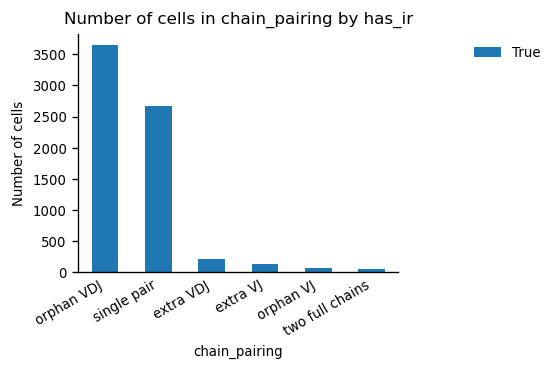

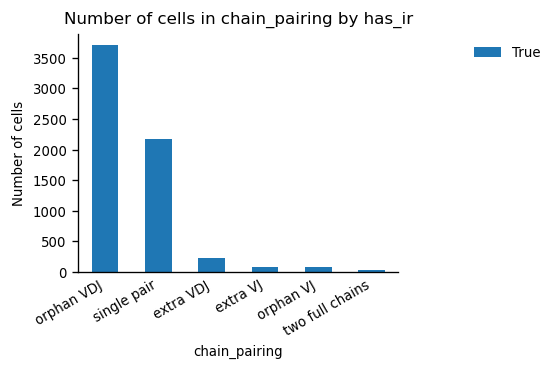

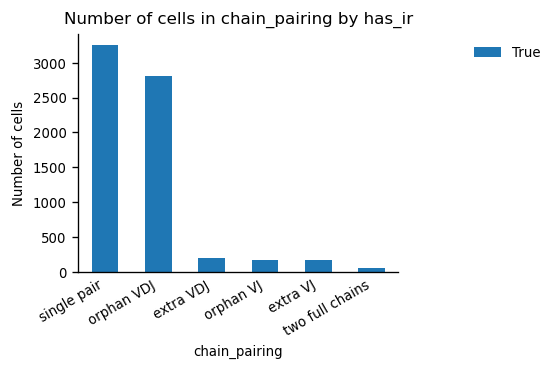

In [14]:
for i in range(0,len(adata_group)): 
    adata_group[i].obs['n_counts'] = adata_group[i].X.sum(1)
    adata_group[i].obs['log_counts'] = np.log(adata_group[i].obs['n_counts'])
    adata_group[i].obs['n_genes'] = (adata_group[i].X > 0).sum(1)
    adata_group[i].obs['log10GenesPerUMI'] = np.log10(adata_group[i].obs['n_genes'])/np.log10(adata_group[i].obs['n_counts']) #This is the complexity

    mt_gene_mask = [gene.startswith('MT-') for gene in adata_group[i].var_names]
    adata_group[i].obs['mt_frac'] = np.array(adata_group[i].X[:, mt_gene_mask].sum(1).ravel())[0]/adata_group[i].obs['n_counts']
    ribo_gene_mask = [gene.startswith('RPL') or gene.startswith('RPS') for gene in adata_group[i].var_names]
    adata_group[i].obs['ribo_frac'] = np.array(adata_group[i].X[:, ribo_gene_mask].sum(1).ravel())[0]/adata_group[i].obs['n_counts']
    print('Number of cells before T filter: {:d}'.format(adata_group[i].n_obs))
    
    cd3s = [z for z in ["CD3D","CD3E","CD3G","CD3Z"] if z in adata_group[i].var_names]
    adata_group[i] = adata_group[i][(adata_group[i][:,cd3s].X.A>0).any(axis = 1) == True,:]
    adata_group[i] = adata_group[i][np.array(adata_group[i][:,'CD19'].X.A==0),:]
    print('Number of cells after T filter: {:d}'.format(adata_group[i].n_obs))
    
    adata_group[i].uns['scirpy_version'] = '0.7'
    scirpy.pl.group_abundance(adata_group[i], groupby="chain_pairing")

In [15]:
for i in range(0,len(adata_group)):
    adata_group[i].write('donor'+str(i)+'matched'+'.h5ad')

### 3 QC

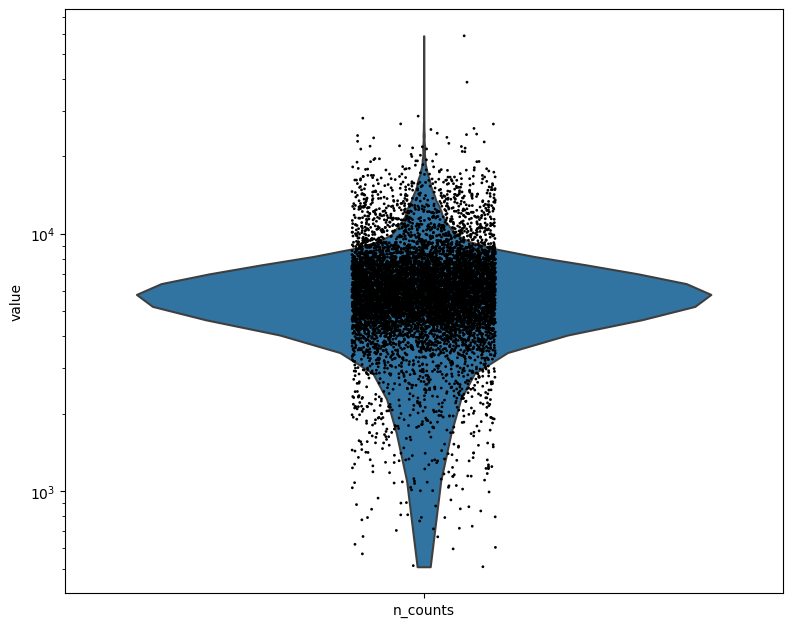

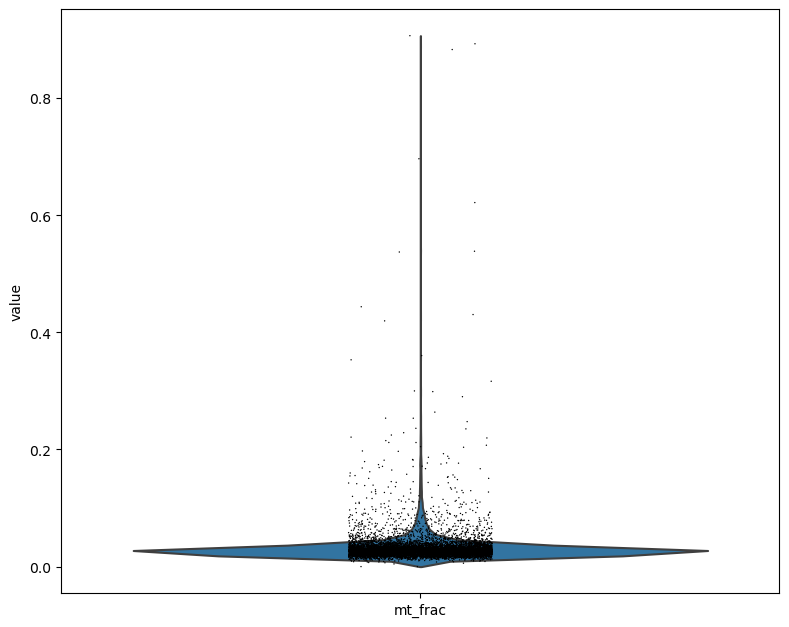

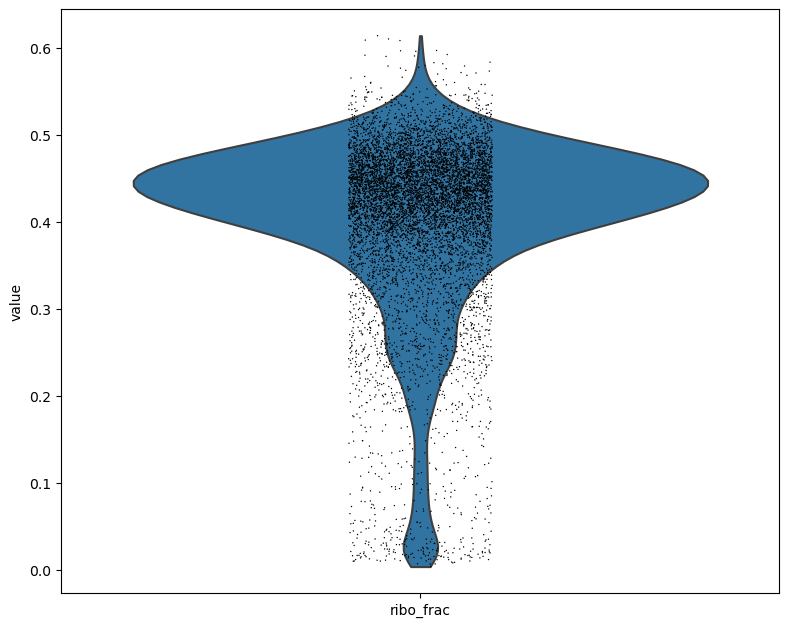

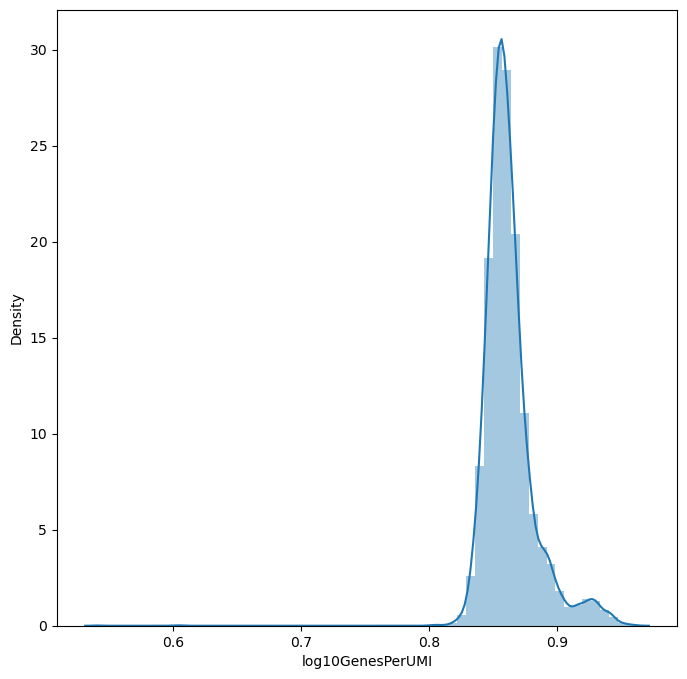

In [16]:
# Quality control - plot QC metrics
t1 = sc.pl.violin(adata_group[0], 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata_group[0], 'mt_frac')
t3 = sc.pl.violin(adata_group[0], 'ribo_frac')
t4 = sns.distplot(adata_group[0].obs['log10GenesPerUMI'],bins = 60)

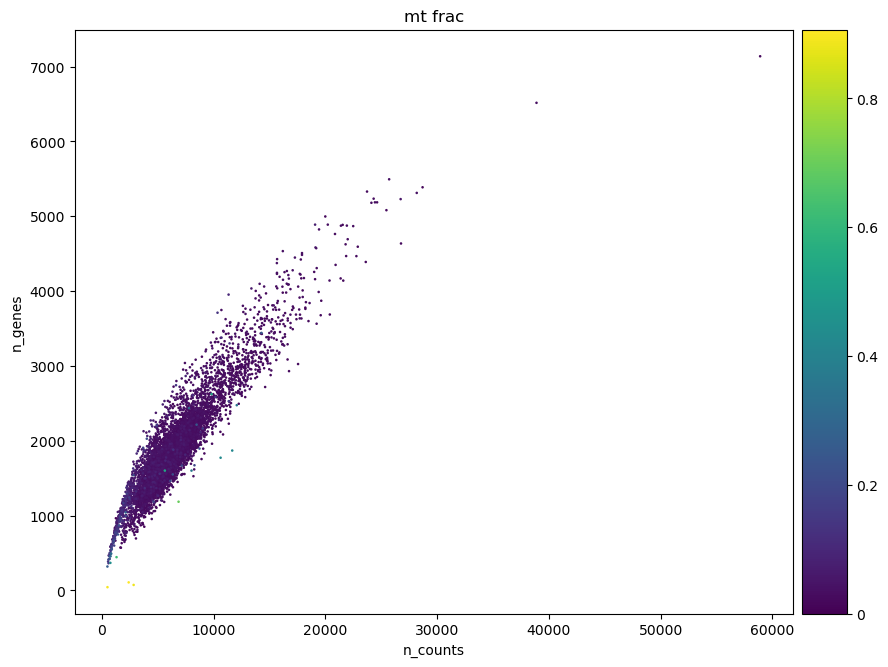

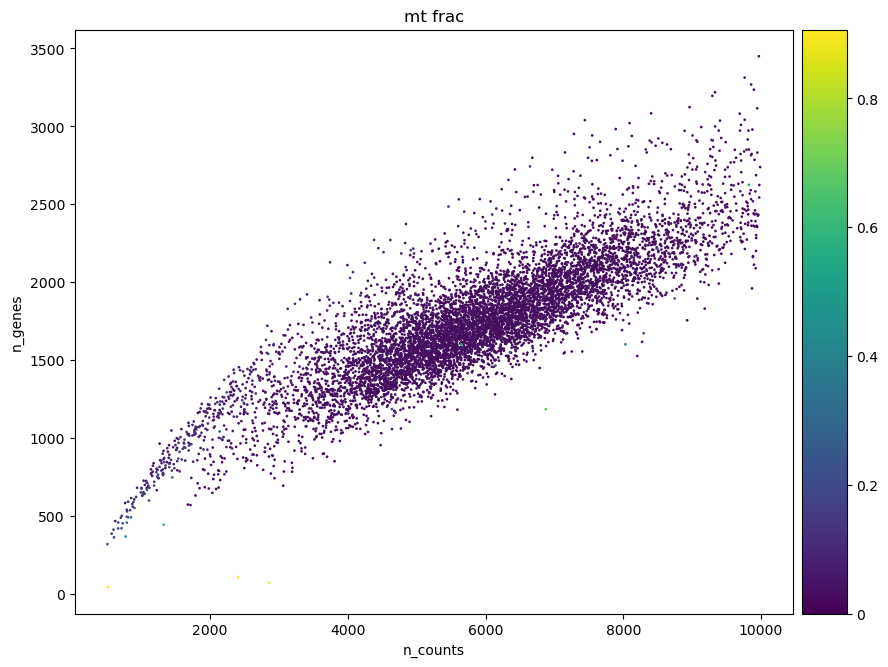

In [17]:
#Data quality summary plots
p1 = sc.pl.scatter(adata_group[0], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata_group[0][adata_group[0].obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

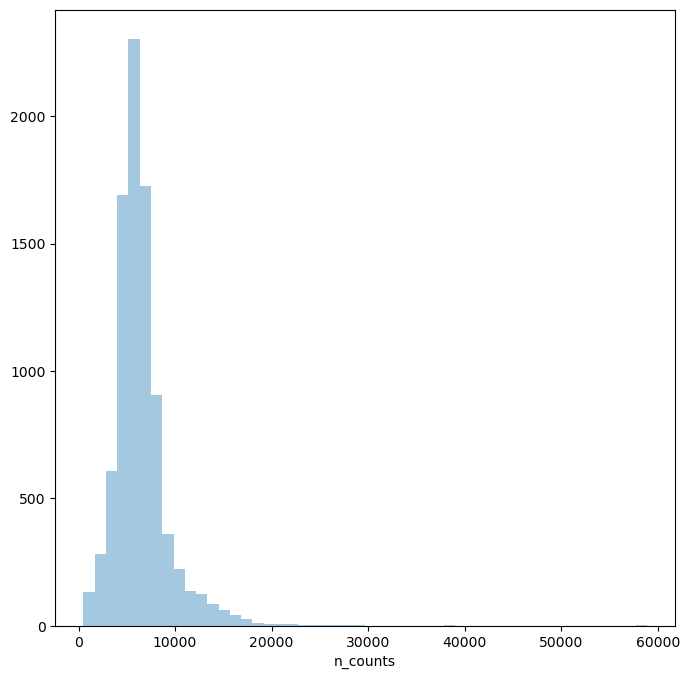

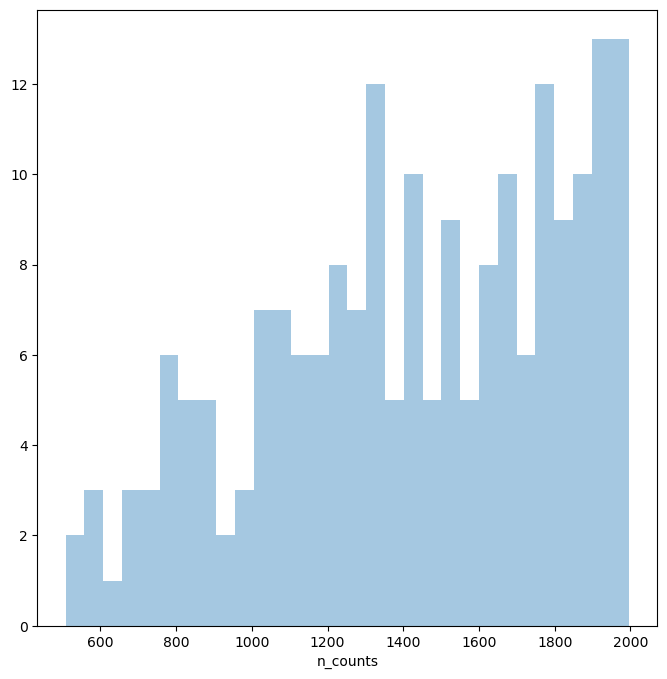

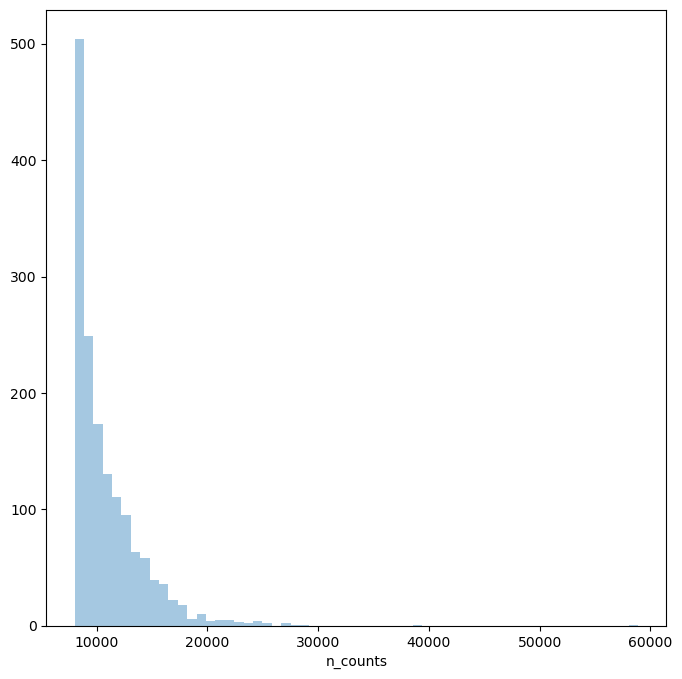

In [18]:
#Thresholding decision: counts
p3 = sns.distplot(adata_group[0].obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata_group[0].obs['n_counts'][adata_group[0].obs['n_counts']<2000], kde=False, bins=30)
plt.show()

p5 = sns.distplot(adata_group[0].obs['n_counts'][adata_group[0].obs['n_counts']>8000], kde=False, bins=60)
plt.show()

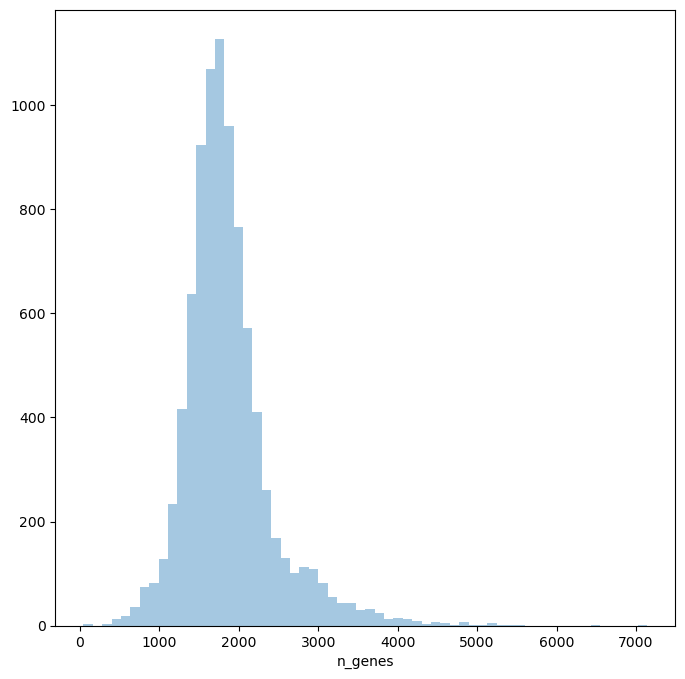

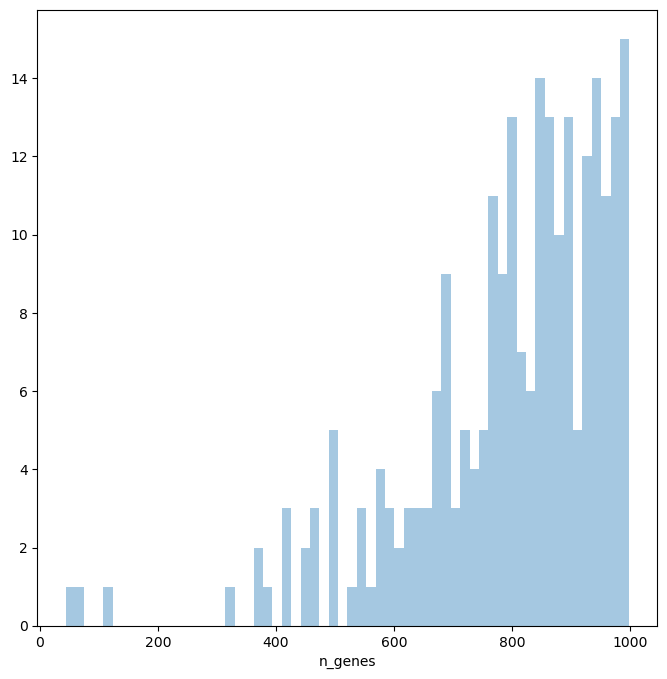

In [19]:
#Thresholding decision: genes
p6 = sns.distplot(adata_group[0].obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata_group[0].obs['n_genes'][adata_group[0].obs['n_genes']<1000], kde=False, bins=60)
plt.show()

In [20]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_group[0].n_obs))

sc.pp.filter_cells(adata_group[0], min_counts = 900)
print('Number of cells after min count filter: {:d}'.format(adata_group[0].n_obs))


adata_group[0] = adata_group[0][adata_group[0].obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata_group[0].n_obs))

sc.pp.filter_cells(adata_group[0], min_genes = 200)
print('Number of cells after gene filter: {:d}'.format(adata_group[0].n_obs))


Total number of cells: 8757
filtered out 27 cells that have less than 900 counts
Number of cells after min count filter: 8730
Number of cells after MT filter: 8707
Number of cells after gene filter: 8707


<AxesSubplot:xlabel='log10GenesPerUMI', ylabel='Density'>

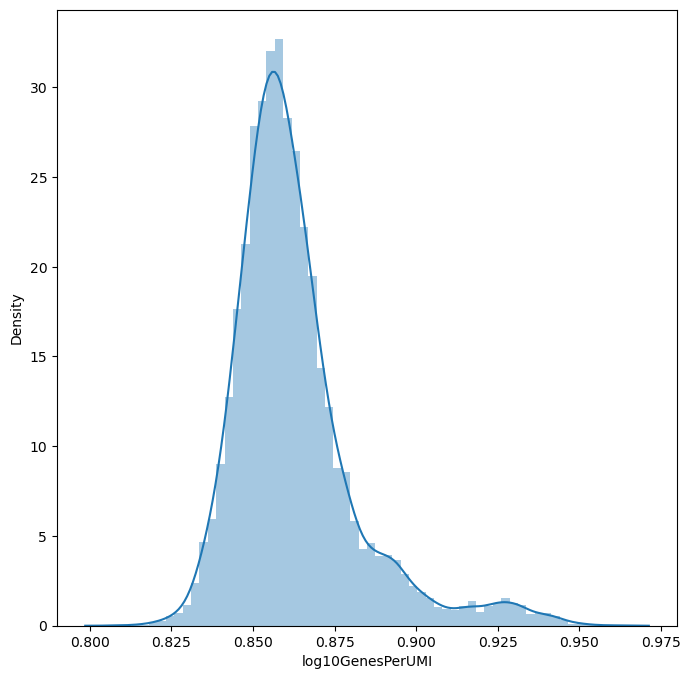

In [21]:
sns.distplot(adata_group[0].obs['log10GenesPerUMI'],bins = 60)

In [22]:
import doubletdetection
clf = doubletdetection.BoostClassifier(n_components = 50, n_top_var_genes = 3000)
# raw_counts is a cells by genes count matrix
labels = clf.fit(adata_group[0].X.A).predict()
# higher means more likely to be doublet
scores = clf.doublet_score()

  0%|          | 0/10 [00:00<?, ?it/s]

computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly repro

In [23]:
adata_group[0]

AnnData object with n_obs × n_vars = 8707 × 36601
    obs: 'has_ir', 'chain_pairing', 'TRAV', 'TRAJ', 'TRBV', 'TRBJ', 'cdr1a', 'cdr2a', 'cdr3a', 'cdr1b', 'cdr2b', 'cdr3b', 'n_counts', 'log_counts', 'n_genes', 'log10GenesPerUMI', 'mt_frac', 'ribo_frac'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'scirpy_version', 'has_ir_colors'

In [24]:
print('Number of cells before doublet filter: {:d}'.format(adata_group[0].n_obs))
adata_group[0] = adata_group[0][labels == 0]
print('Number of cells after doublet filter: {:d}'.format(adata_group[0].n_obs))

Number of cells before doublet filter: 8707
Number of cells after doublet filter: 8086


<AxesSubplot:xlabel='log10GenesPerUMI', ylabel='Density'>

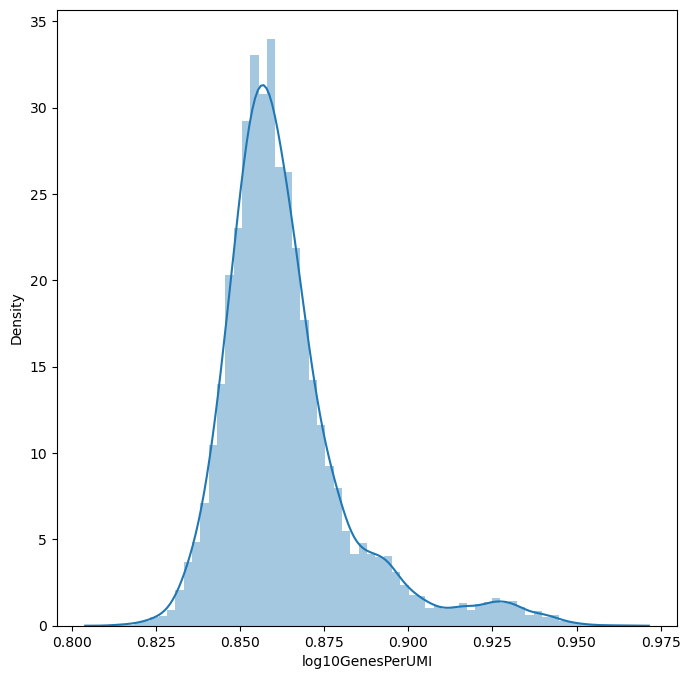

In [25]:
%matplotlib inline
sns.distplot(adata_group[0].obs['log10GenesPerUMI'],bins = 60)

### 4 QC

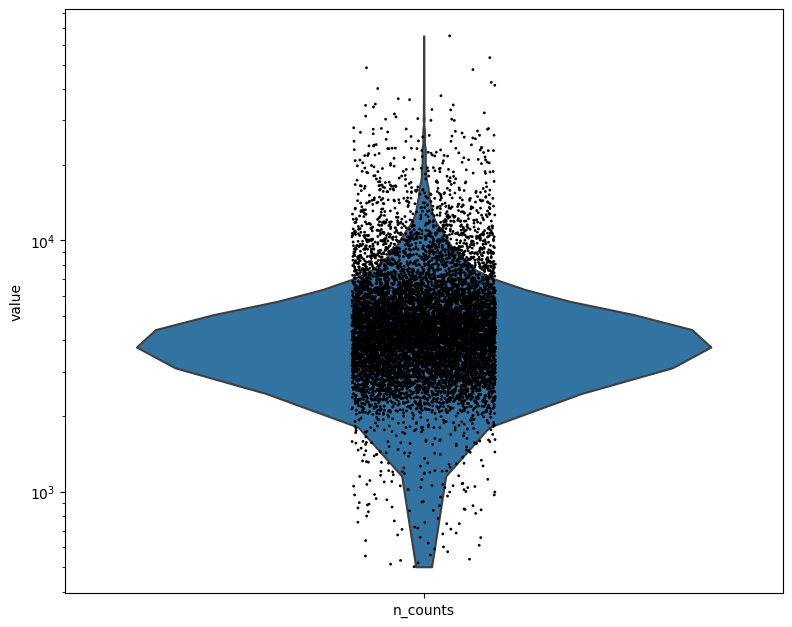

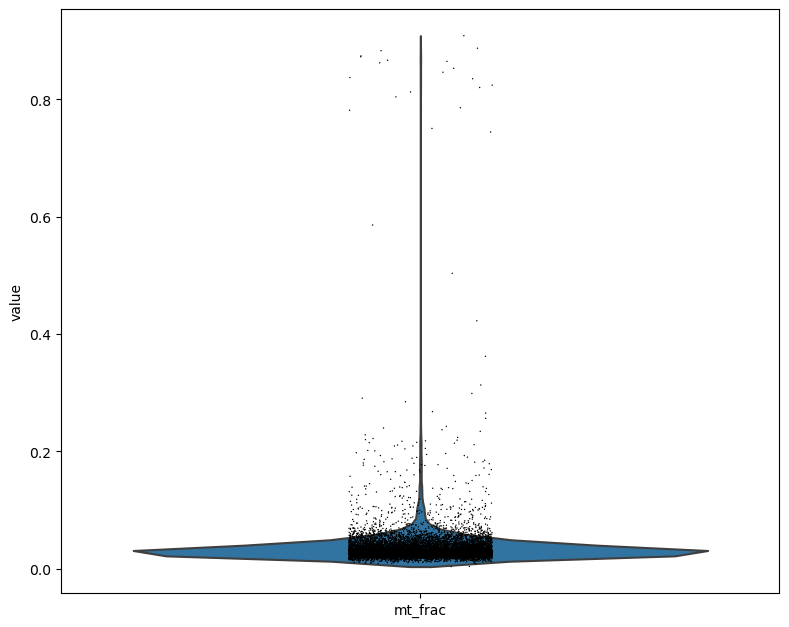

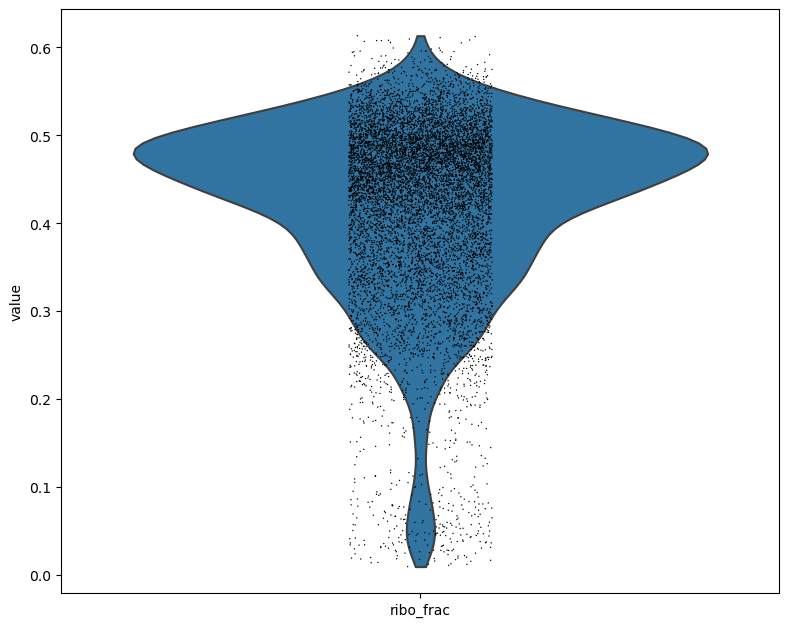

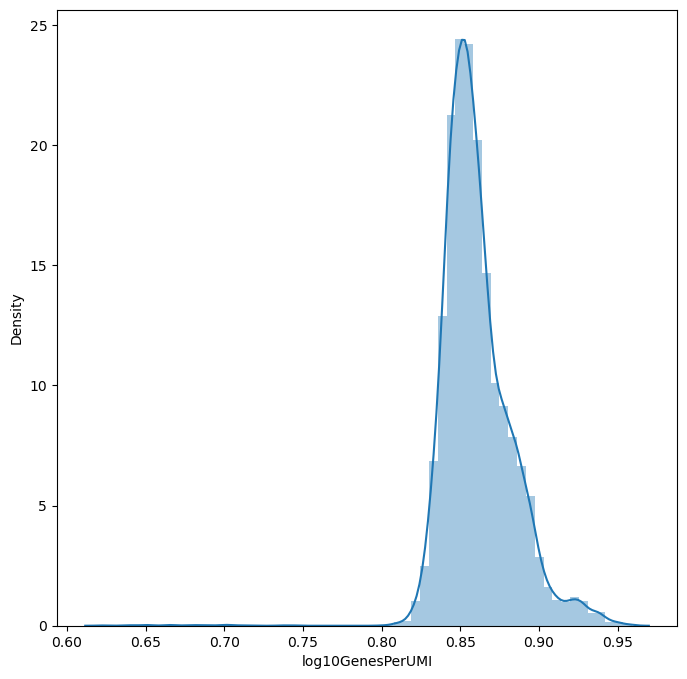

In [26]:
# Quality control - plot QC metrics
t1 = sc.pl.violin(adata_group[1], 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata_group[1], 'mt_frac')
t3 = sc.pl.violin(adata_group[1], 'ribo_frac')
t4 = sns.distplot(adata_group[1].obs['log10GenesPerUMI'],bins = 60)

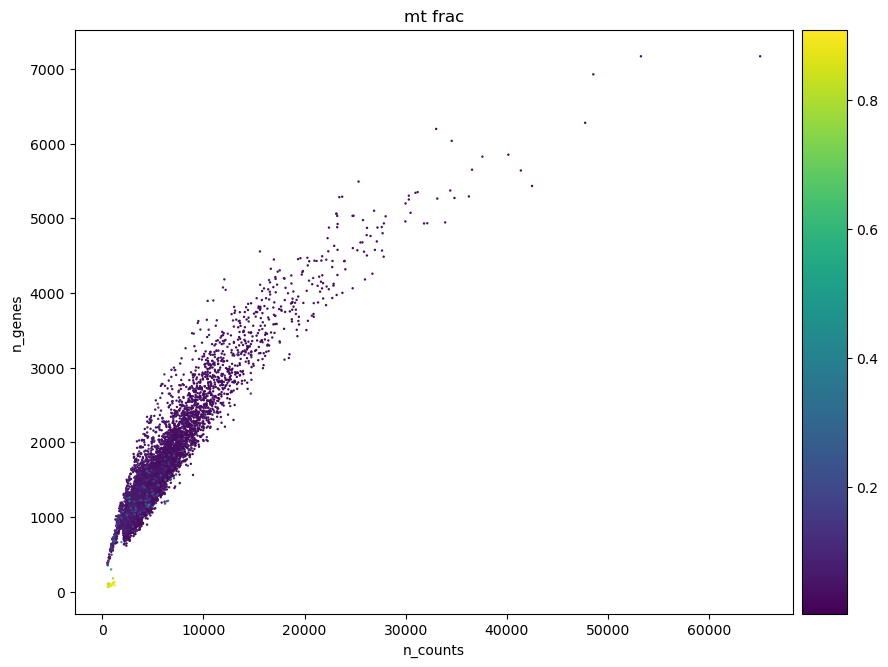

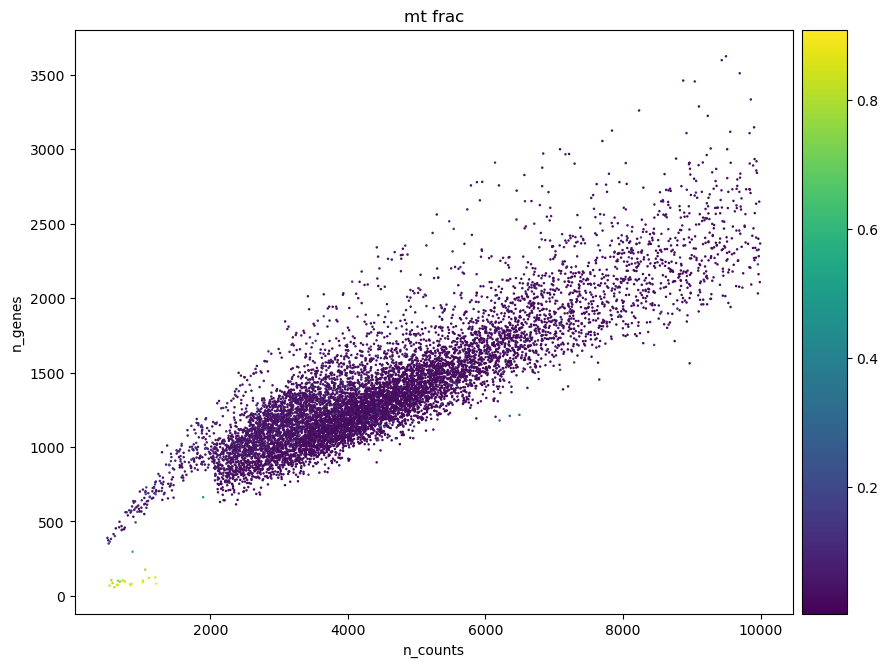

In [27]:
#Data quality summary plots
p1 = sc.pl.scatter(adata_group[1], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata_group[1][adata_group[1].obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

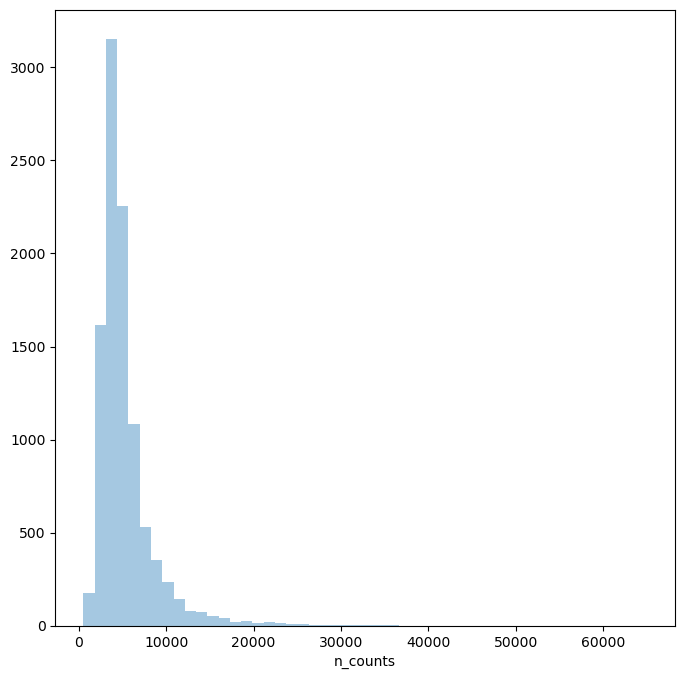

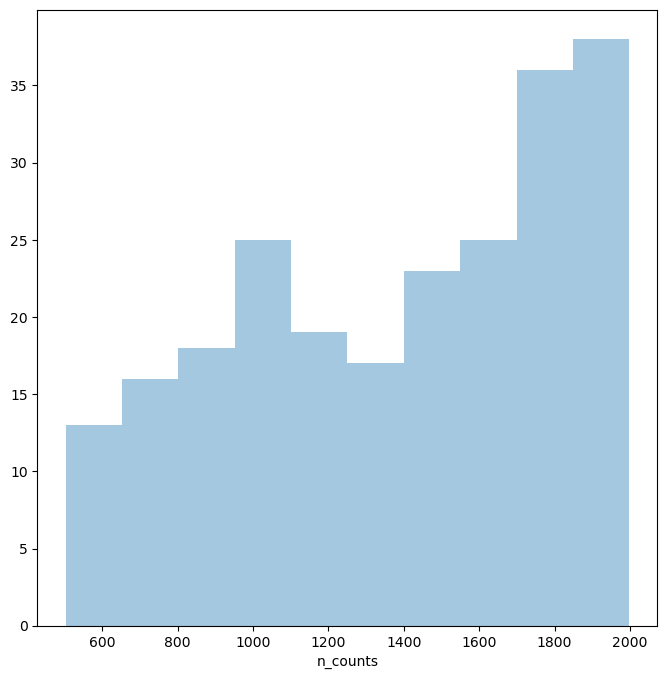

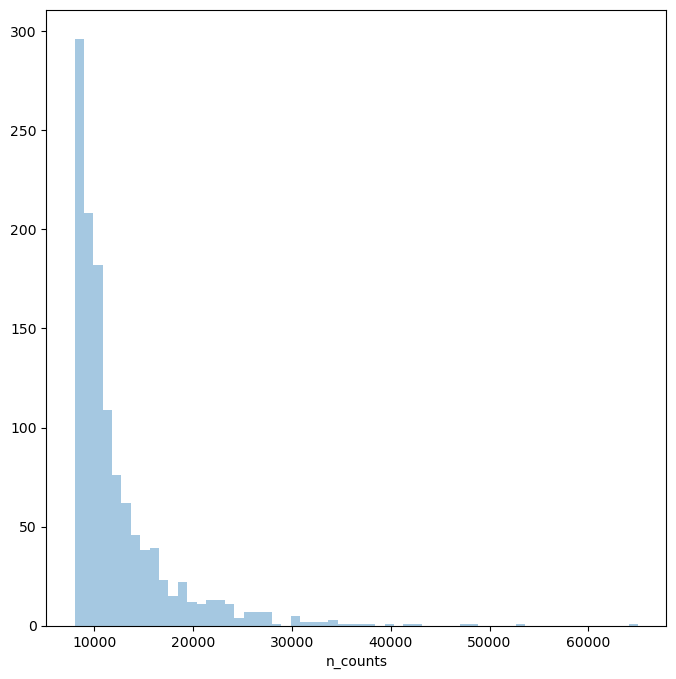

In [28]:
#Thresholding decision: counts
p3 = sns.distplot(adata_group[1].obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata_group[1].obs['n_counts'][adata_group[1].obs['n_counts']<2000], kde=False, bins=10)
plt.show()

p5 = sns.distplot(adata_group[1].obs['n_counts'][adata_group[1].obs['n_counts']>8000], kde=False, bins=60)
plt.show()

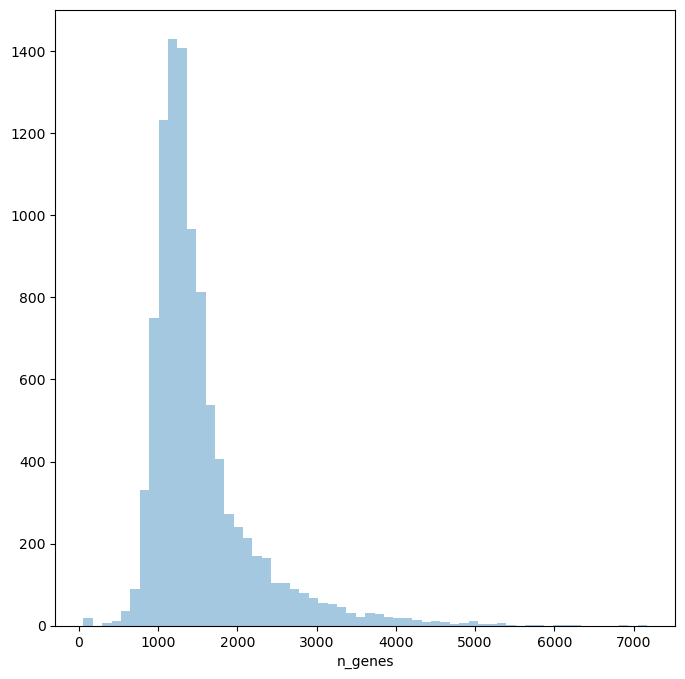

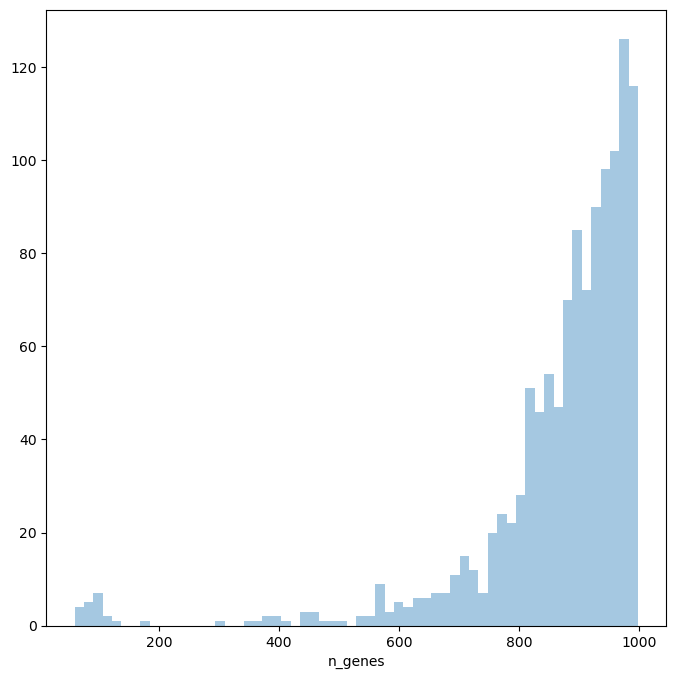

In [29]:
#Thresholding decision: genes
p6 = sns.distplot(adata_group[1].obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata_group[1].obs['n_genes'][adata_group[1].obs['n_genes']<1000], kde=False, bins=60)
plt.show()

In [30]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_group[1].n_obs))

sc.pp.filter_cells(adata_group[1], min_counts = 1300)
print('Number of cells after min count filter: {:d}'.format(adata_group[1].n_obs))


adata_group[1] = adata_group[1][adata_group[1].obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata_group[1].n_obs))

sc.pp.filter_cells(adata_group[1], min_genes = 200)
print('Number of cells after gene filter: {:d}'.format(adata_group[1].n_obs))


Total number of cells: 9950
filtered out 98 cells that have less than 1300 counts
Number of cells after min count filter: 9852
Number of cells after MT filter: 9823
Number of cells after gene filter: 9823


<AxesSubplot:xlabel='log10GenesPerUMI', ylabel='Density'>

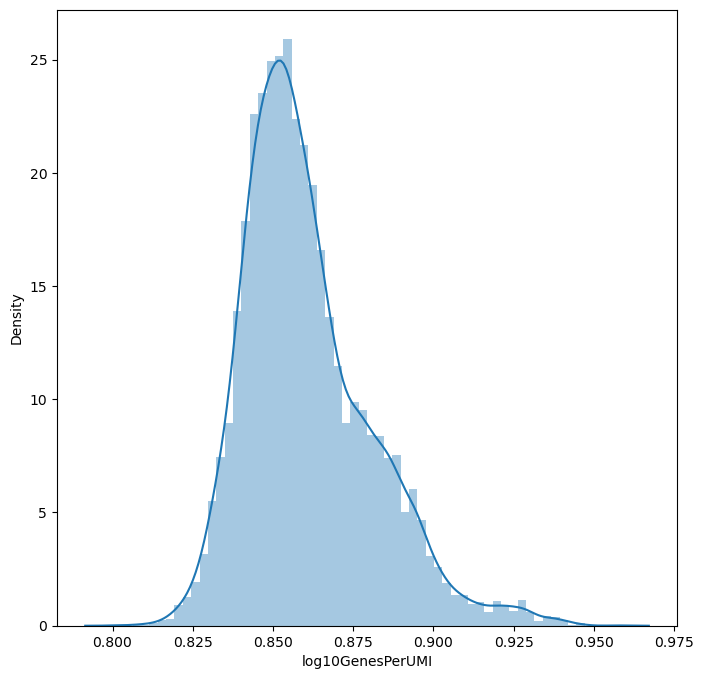

In [31]:
sns.distplot(adata_group[1].obs['log10GenesPerUMI'],bins = 60)

In [32]:
clf = doubletdetection.BoostClassifier(n_components = 50, n_top_var_genes = 3000)
# raw_counts is a cells by genes count matrix
labels = clf.fit(adata_group[1].X.A).predict()
# higher means more likely to be doublet
scores = clf.doublet_score()

  0%|          | 0/10 [00:00<?, ?it/s]

computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly repro

In [33]:
print('Number of cells before doublet filter: {:d}'.format(adata_group[1].n_obs))
adata_group[1] = adata_group[1][labels == 0]
print('Number of cells after doublet filter: {:d}'.format(adata_group[1].n_obs))

Number of cells before doublet filter: 9823
Number of cells after doublet filter: 8639


<AxesSubplot:xlabel='log10GenesPerUMI', ylabel='Density'>

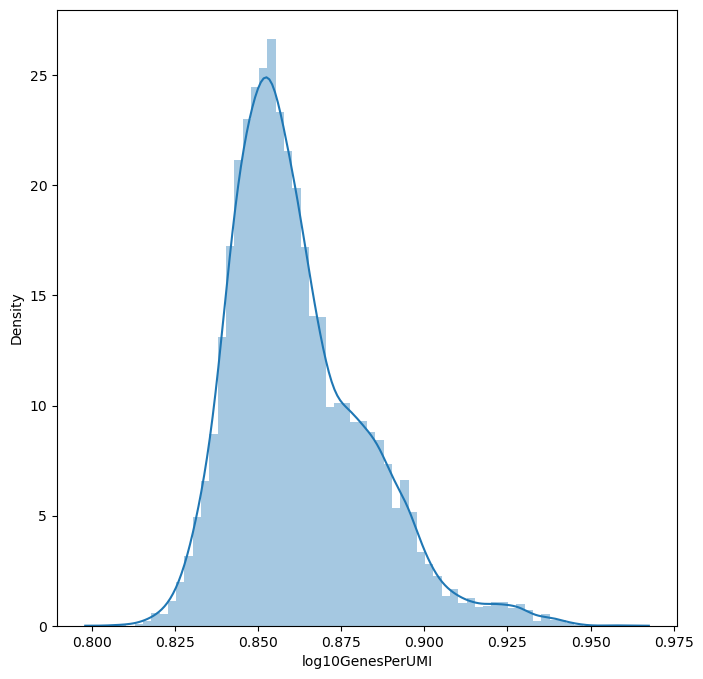

In [34]:
%matplotlib inline
sns.distplot(adata_group[1].obs['log10GenesPerUMI'],bins = 60)

### 5 QC

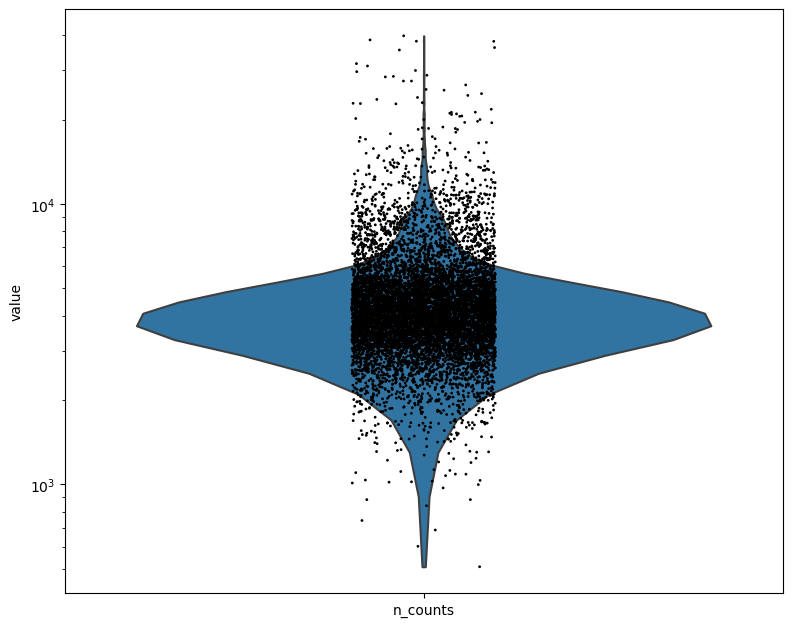

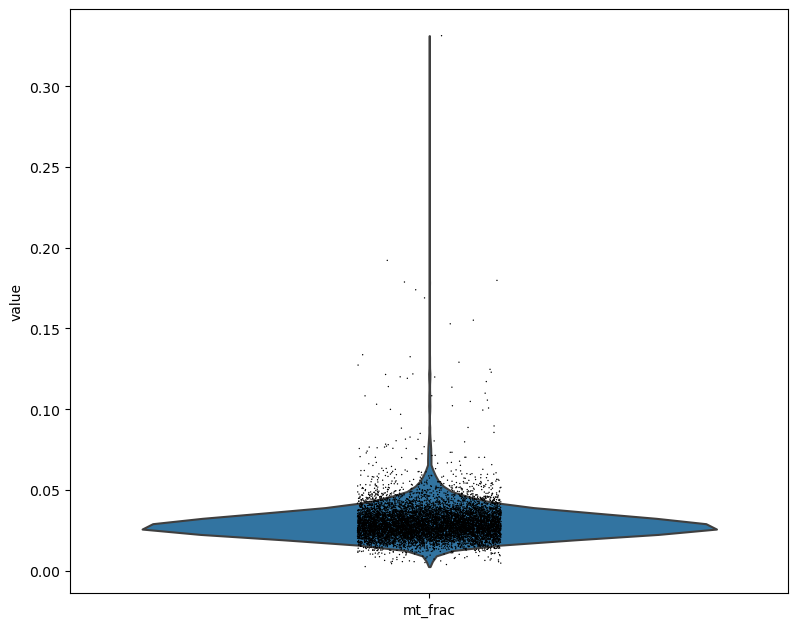

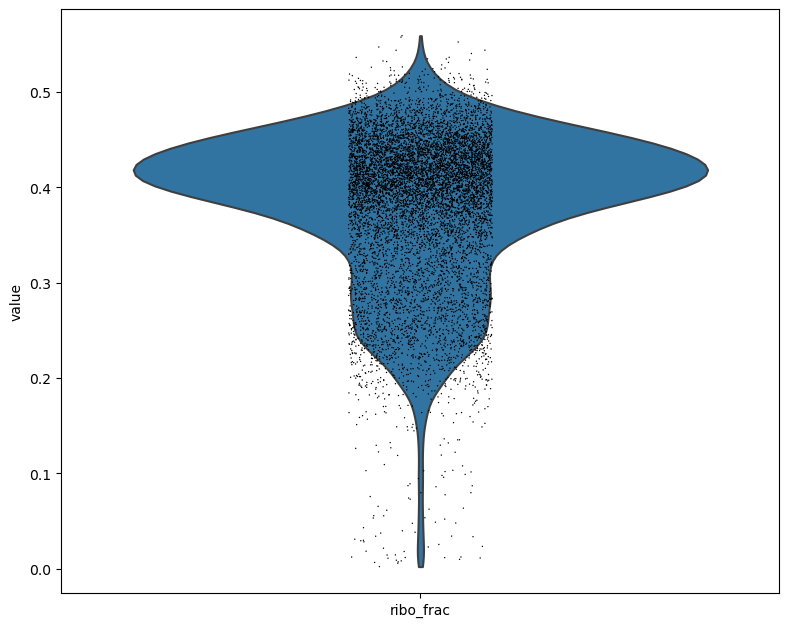

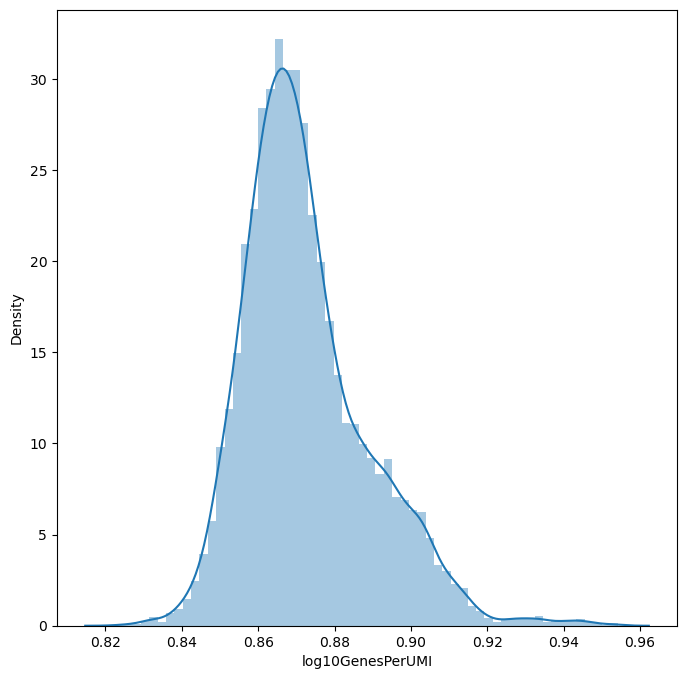

In [35]:
# Quality control - plot QC metrics
t1 = sc.pl.violin(adata_group[2], 'n_counts', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata_group[2], 'mt_frac')
t3 = sc.pl.violin(adata_group[2], 'ribo_frac')
t4 = sns.distplot(adata_group[2].obs['log10GenesPerUMI'],bins = 60)

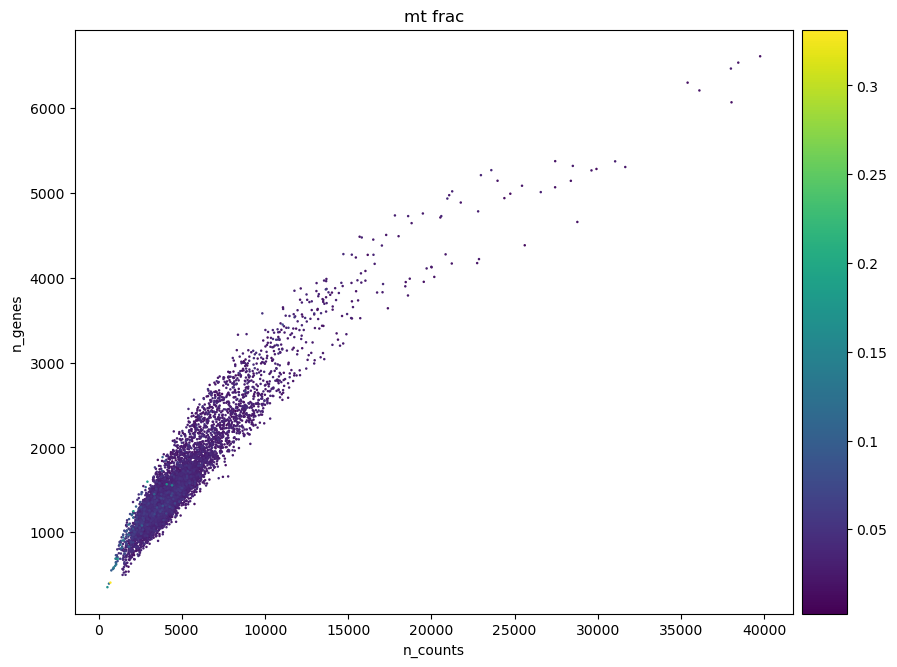

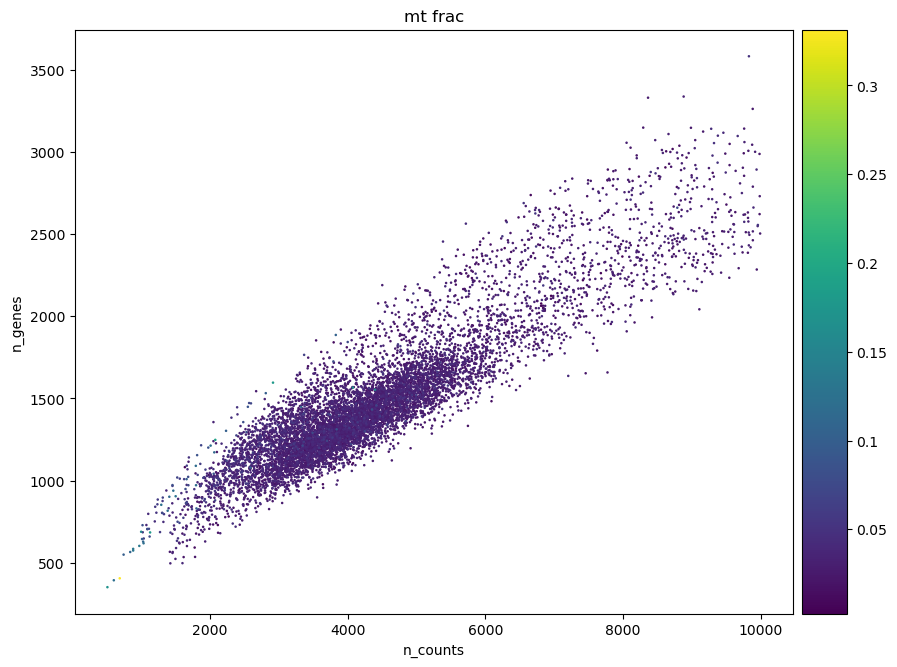

In [36]:
#Data quality summary plots
p1 = sc.pl.scatter(adata_group[2], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata_group[2][adata_group[2].obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

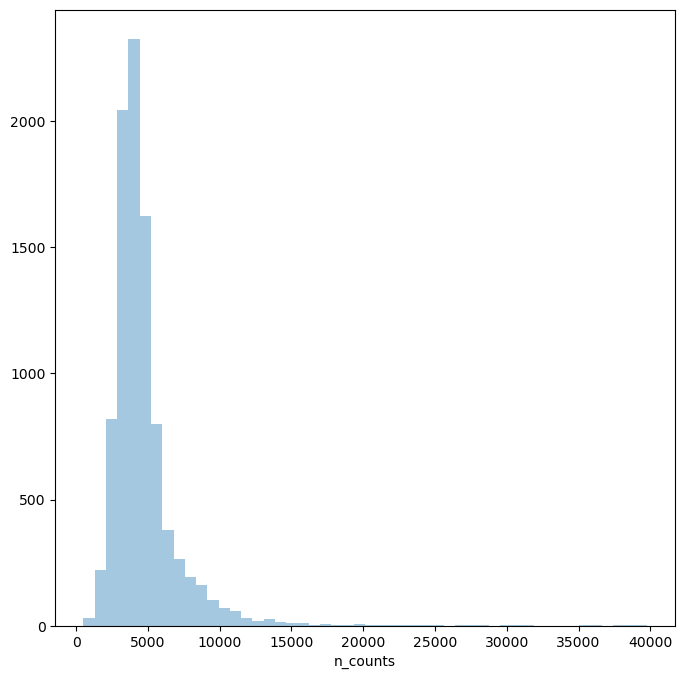

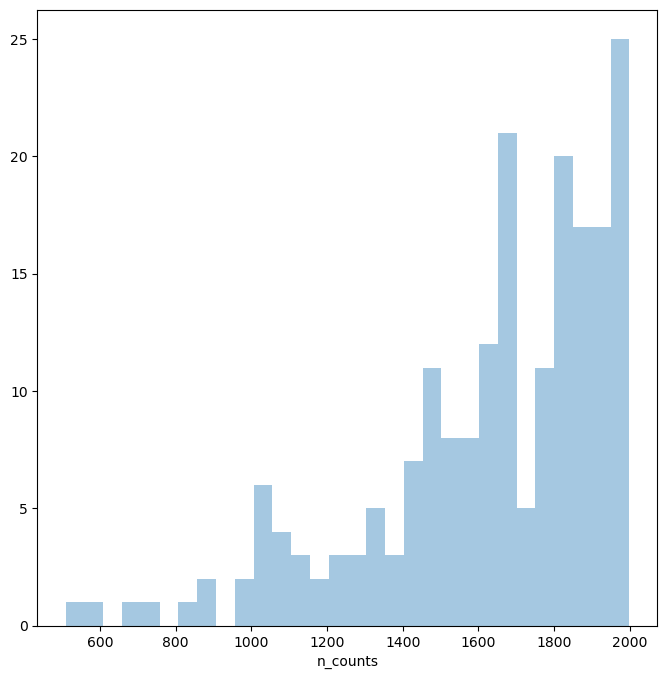

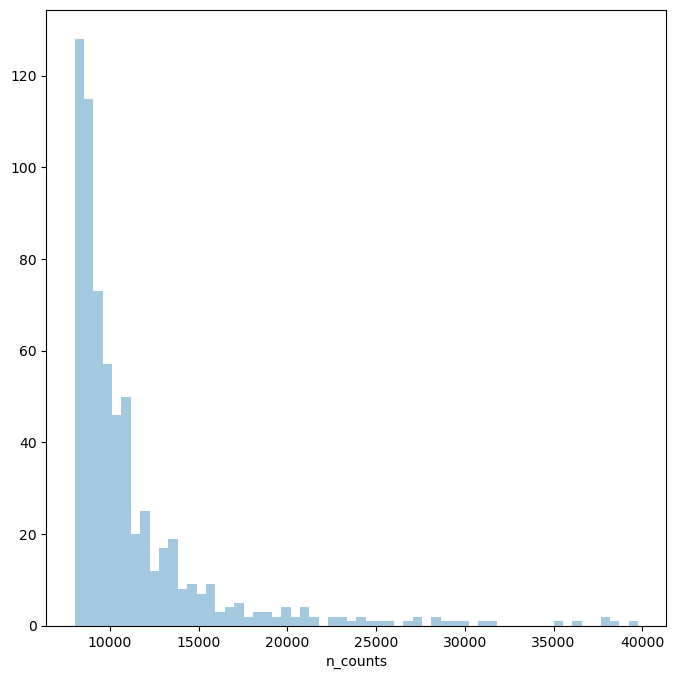

In [37]:
#Thresholding decision: counts
p3 = sns.distplot(adata_group[2].obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata_group[2].obs['n_counts'][adata_group[2].obs['n_counts']<2000], kde=False, bins=30)
plt.show()

p5 = sns.distplot(adata_group[2].obs['n_counts'][adata_group[2].obs['n_counts']>8000], kde=False, bins=60)
plt.show()

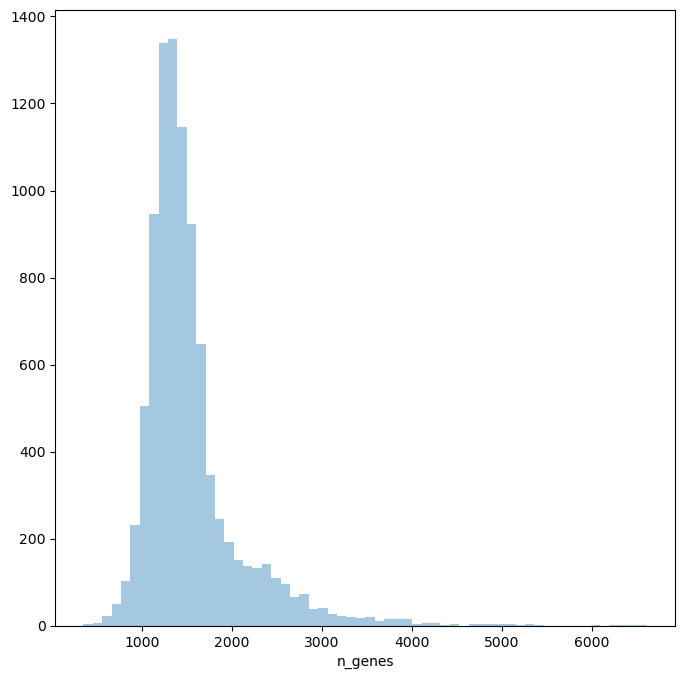

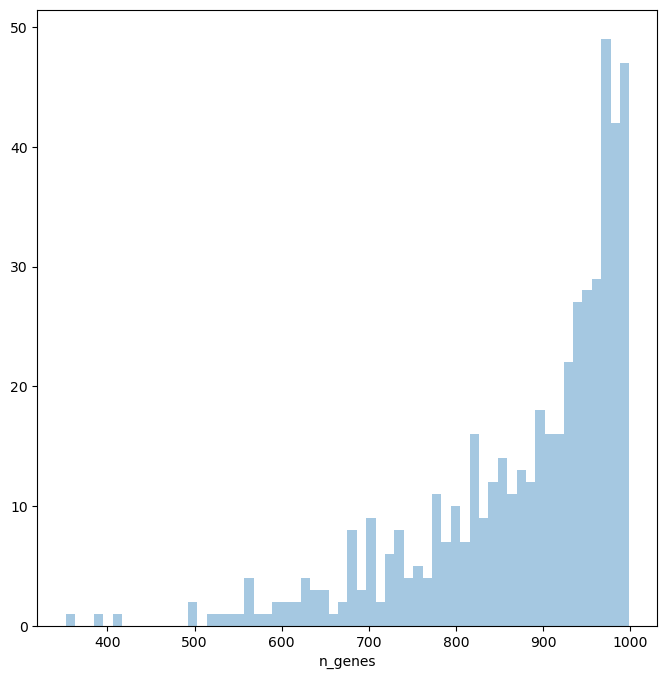

In [38]:
#Thresholding decision: genes
p6 = sns.distplot(adata_group[2].obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata_group[2].obs['n_genes'][adata_group[2].obs['n_genes']<1000], kde=False, bins=60)
plt.show()

In [39]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_group[2].n_obs))

sc.pp.filter_cells(adata_group[2], min_counts = 1100)
print('Number of cells after min count filter: {:d}'.format(adata_group[2].n_obs))


adata_group[2] = adata_group[2][adata_group[2].obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata_group[2].n_obs))

sc.pp.filter_cells(adata_group[2], min_genes = 450)
print('Number of cells after gene filter: {:d}'.format(adata_group[2].n_obs))


Total number of cells: 9261
filtered out 18 cells that have less than 1100 counts
Number of cells after min count filter: 9243
Number of cells after MT filter: 9243
Number of cells after gene filter: 9243


<AxesSubplot:xlabel='log10GenesPerUMI', ylabel='Density'>

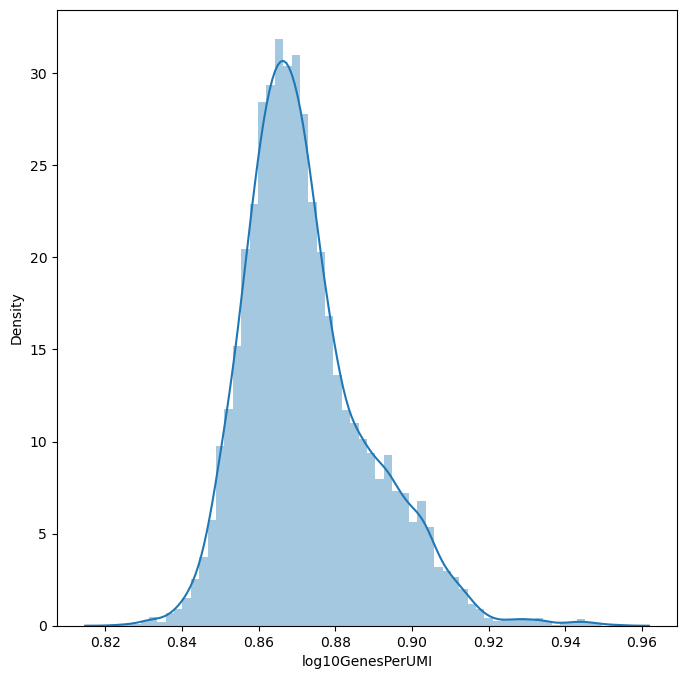

In [40]:
sns.distplot(adata_group[2].obs['log10GenesPerUMI'],bins = 60)

In [41]:
clf = doubletdetection.BoostClassifier(n_components = 50, n_top_var_genes = 3000)
# raw_counts is a cells by genes count matrix
labels = clf.fit(adata_group[2].X.A).predict()
# higher means more likely to be doublet
scores = clf.doublet_score()

  0%|          | 0/10 [00:00<?, ?it/s]

computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=50
    finished (0:00:00)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly repro

In [42]:
print('Number of cells before doublet filter: {:d}'.format(adata_group[2].n_obs))
adata_group[2] = adata_group[2][labels == 0]
print('Number of cells after doublet filter: {:d}'.format(adata_group[2].n_obs))

Number of cells before doublet filter: 9243
Number of cells after doublet filter: 8475


<AxesSubplot:xlabel='log10GenesPerUMI', ylabel='Density'>

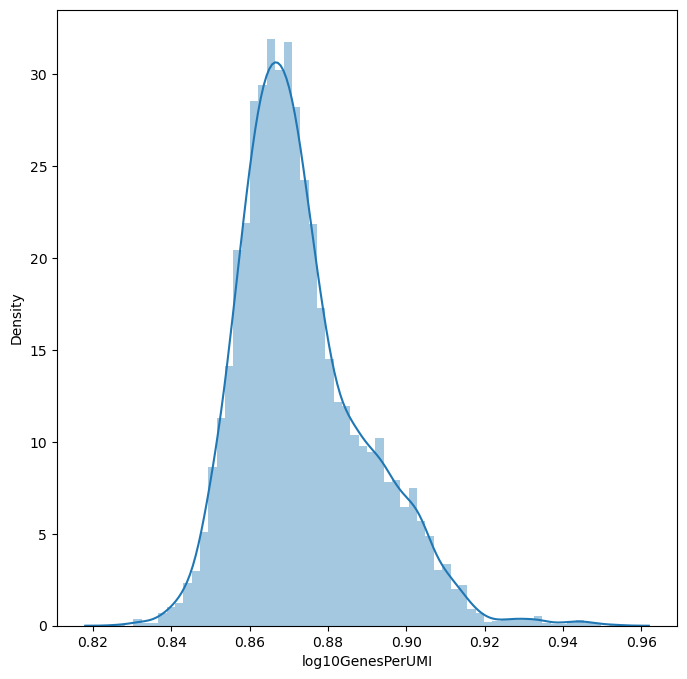

In [43]:
%matplotlib inline
sns.distplot(adata_group[2].obs['log10GenesPerUMI'],bins = 60)

### concat

In [44]:
adata_concat = adata_group[0].concatenate(adata_group[1],adata_group[2], batch_categories=['3', '4','5'])

In [45]:
sc.pp.filter_genes(adata_concat, min_cells = 2)

filtered out 12196 genes that are detected in less than 2 cells


In [46]:
adata_concat.layers['raw_filtered'] = adata_concat.X

In [47]:
adata_concat.obs['n_counts'] = adata_concat.X.sum(1)
adata_concat.obs['log_counts'] = np.log(adata_concat.obs['n_counts'])
adata_concat.obs['n_genes'] = (adata_concat.X > 0).sum(1)
adata_concat.obs['log10GenesPerUMI'] = np.log10(adata_concat.obs['n_genes'])/np.log10(adata_concat.obs['n_counts'])

mt_gene_mask = [gene.startswith('MT-') for gene in adata_concat.var_names]
adata_concat.obs['mt_frac'] = np.array(adata_concat.X[:, mt_gene_mask].sum(1).ravel())[0]/adata_concat.obs['n_counts']
ribo_gene_mask = [gene.startswith('RPL') or gene.startswith('RPS') for gene in adata_concat.var_names]
adata_concat.obs['ribo_frac'] = np.array(adata_concat.X[:, ribo_gene_mask].sum(1).ravel())[0]/adata_concat.obs['n_counts']

In [48]:
adata_forcycle = adata_concat.copy()
sc.pp.normalize_total(adata_forcycle, key_added = 'normalization_factors')
sc.pp.log1p(adata_forcycle)

normalizing counts per cell
    finished (0:00:00)


### Find HVG and proceed to dimesion reduction PCA + UMAP

In [49]:
sc.pp.highly_variable_genes(adata_forcycle, flavor='seurat', n_top_genes=2000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_forcycle.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 2000


In [50]:
sc.pp.pca(adata_forcycle, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_forcycle, n_neighbors = 15, n_pcs = 50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)


In [51]:
sc.tl.umap(adata_forcycle, min_dist = 0.2, spread = 1)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


### Use the cell cycle gene list summarized by Triosh et al. to calculate the cc score

In [52]:
cc_genes = pd.read_excel('Triosh_cc.xlsx')

In [53]:
s_genes = cc_genes['G1/S'].dropna()
g2m_genes = cc_genes['G2/M'].dropna()

s_genes_mm_ens = adata_forcycle.var_names[np.in1d(adata_forcycle.var_names, s_genes)]
g2m_genes_mm_ens = adata_forcycle.var_names[np.in1d(adata_forcycle.var_names, g2m_genes)]

In [54]:
sc.tl.score_genes_cell_cycle(adata_forcycle, s_genes=s_genes_mm_ens, g2m_genes=g2m_genes_mm_ens)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    586 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    710 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


### Visualize the cell phases of the co-cultured cells

... storing 'TRAV' as categorical
... storing 'TRAJ' as categorical
... storing 'TRBV' as categorical
... storing 'cdr1a' as categorical
... storing 'cdr2a' as categorical
... storing 'cdr3a' as categorical
... storing 'cdr1b' as categorical
... storing 'cdr2b' as categorical
... storing 'cdr3b' as categorical
... storing 'phase' as categorical


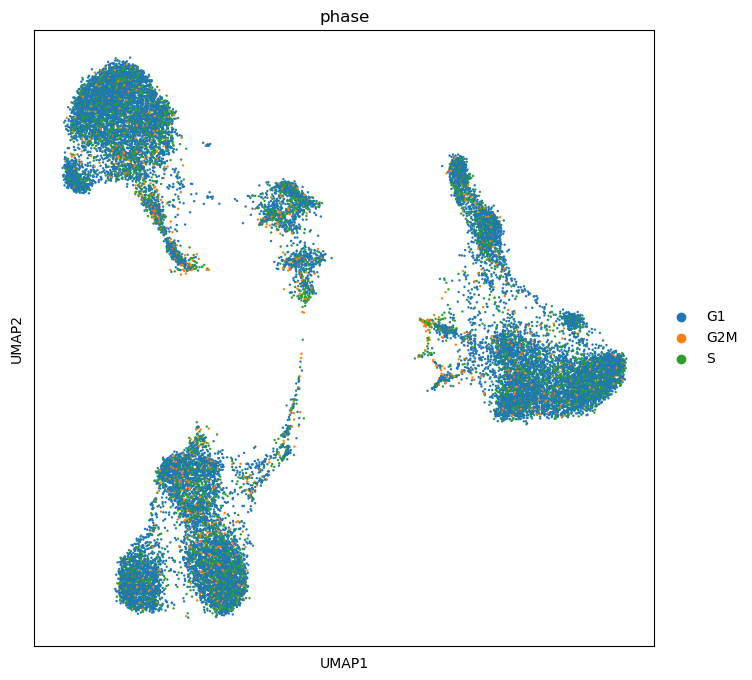

In [55]:
sc.pl.umap(adata_forcycle, color='phase',size = 12)

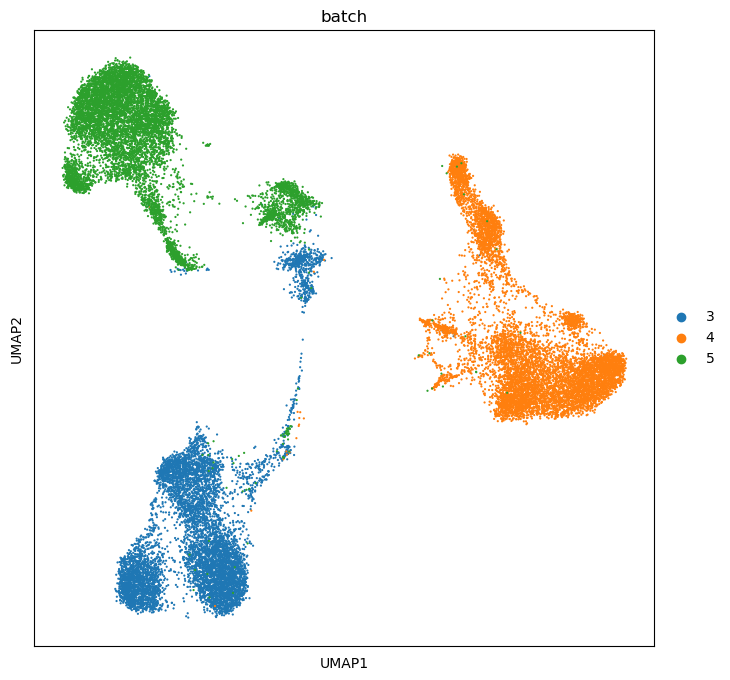

In [56]:
sc.pl.umap(adata_forcycle, color='batch',size = 10)

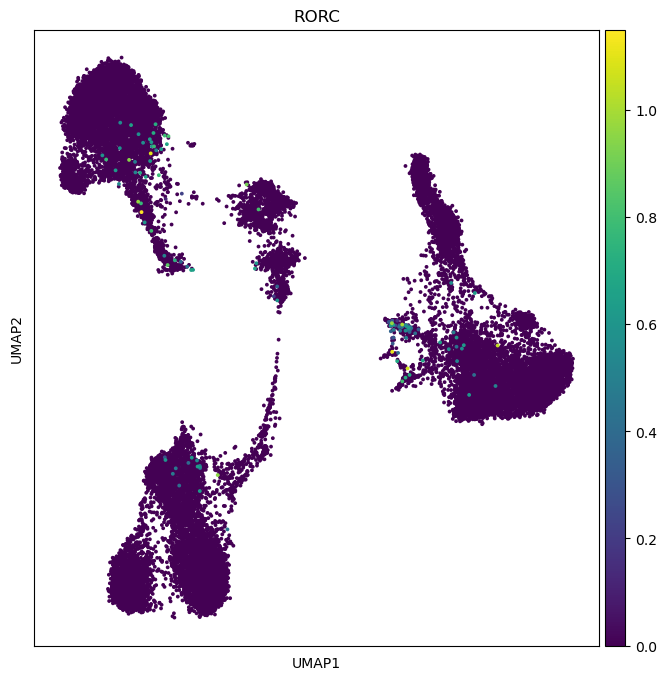

In [57]:
sc.pl.umap(adata_forcycle, color='RORC',size = 30)

### Export the result to input it into the Seurat

In [58]:
Sscore = adata_forcycle.obs['S_score'].values.tolist()
G2Mscore = adata_forcycle.obs['G2M_score'].values.tolist()
S_G2M_diff = adata_forcycle.obs['S_score'] - adata_forcycle.obs['G2M_score']
S_G2M_diff = S_G2M_diff.values.tolist()

In [59]:
adata_concat.uns['allgenes'] = list(adata_concat.var_names)
adata_concat.obs['S_score'] = adata_forcycle.obs['S_score']
adata_concat.obs['G2M_score'] = adata_forcycle.obs['G2M_score']
adata_concat.obs['S_G2M_diff'] = adata_concat.obs['S_score'] - adata_concat.obs['G2M_score']
adata_concat.obs['phase'] = adata_forcycle.obs['phase']

In [60]:
colnames = adata_concat.obs_names
rownames = adata_concat.var_names
mt_frac = adata_concat.obs['mt_frac']
batch = adata_concat.obs['batch']
counts = adata_concat.X.T

In [61]:
%%R -i counts -i colnames -i rownames -i S_G2M_diff -i mt_frac -i Sscore -i G2Mscore -i batch
colnames(counts) = colnames
rownames(counts) = rownames

srat <- CreateSeuratObject(counts = counts, project = "IEL", min.cells = 0, min.features = 0, assay = "RNA")

srat[["S_G2M_diff"]] = S_G2M_diff
srat[["mt_frac"]] = mt_frac
srat[["Sscore"]] = Sscore
srat[["G2Mscore"]] = G2Mscore
srat[["batch"]] = batch

In [62]:
%%R
cond.list = SplitObject(srat, split.by = "batch")
d3 <- cond.list[["3"]]
d4 <- cond.list[["4"]]
d5 <- cond.list[["5"]]

d3 = SCTransform(object = d3, verbose = FALSE,  vst.flavor = "v2",vars.to.regress = c("G2Mscore","Sscore","mt_frac"),min_cells=0) #c("G2Mscore","Sscore"))

d3 = RunPCA(d3, verbose = FALSE)

d4 = SCTransform(object = d4, verbose = FALSE, vst.flavor = "v2", vars.to.regress = c("G2Mscore","Sscore","mt_frac"),min_cells=0) #c("G2Mscore","Sscore"))

d4 = RunPCA(d4, verbose = FALSE)

d5 = SCTransform(object = d5, verbose = FALSE, vst.flavor = "v2", vars.to.regress = c("G2Mscore","Sscore","mt_frac"),min_cells=0) #c("G2Mscore","Sscore"))

d5 = RunPCA(d5, verbose = FALSE)

In [63]:
%%R
ifnb.list <- list(d3 = d3, d4 = d4, d5 = d5)
features <- SelectIntegrationFeatures(object.list = ifnb.list, nfeatures = 3000)
ifnb.list <- PrepSCTIntegration(object.list = ifnb.list, anchor.features = features)

mod.anchors <- FindIntegrationAnchors(object.list = ifnb.list, normalization.method = "SCT",
    anchor.features = features)
srat_combined <- IntegrateData(anchorset = mod.anchors, normalization.method = "SCT")

  |                                                  | 0 % ~calculating   |+++++++++++++++++                                 | 33% ~07s           |++++++++++++++++++++++++++++++++++                | 67% ~03s           |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=08s  
  |                                                  | 0 % ~calculating   |+++++++++++++++++                                 | 33% ~09m 39s       |++++++++++++++++++++++++++++++++++                | 67% ~04m 54s       |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=14m 55s


In [64]:
%%R -o HVG -o varExplained -o PCs -o mat -o adata_transformed -o left_genes

srat_combined = RunPCA(srat_combined,verbose = FALSE)

HVG = VariableFeatures(srat_combined)

mat <- Seurat::GetAssayData(object = srat_combined, slot = 'scale.data')
pca <- srat_combined[["pca"]]

# Get the total variance:
total_variance <- sum(matrixStats::rowVars(mat))

eigValues = (pca@stdev)^2  ## EigenValues
varExplained = eigValues / total_variance

PCs = Loadings(srat_combined, reduction = "pca")

adata_transformed = as.SingleCellExperiment(srat_combined)
left_genes = rownames(x = srat_combined[["SCT"]])

In [65]:
%%R -o counts -o logcounts

counts = srat_combined[["SCT"]]@counts
logcounts = srat_combined[["SCT"]]@data

In [66]:
%R -o srat_combined

In [67]:
import anndata
adata = anndata.AnnData(X = logcounts.T)
adata.var_names = left_genes
adata.obs_names = adata_transformed.obs_names
adata.obs = adata_concat.obs
adata.uns['residuals'] = mat.T
adata.layers['counts'] = counts.T
adata.layers['logcounts'] = logcounts.T
adata.obsm['X_pca'] = adata_transformed.obsm['X_pca']
adata.layers['raw'] = adata_concat.layers['raw_filtered']

In [68]:
adata.varm['PCs'] = np.zeros([np.shape(adata.X.A)[1],50])
for i in range(0,50):
    genename = HVG[i]
    adata.varm['PCs'][adata.var_names == genename,:] = PCs[i,:]

In [69]:
adata.obs['n_counts'] = adata.layers['counts'].sum(1)
adata.obs['n_genes'] = (adata.layers['counts'] > 0).sum(1)
adata.var['highly_variable'] = adata.var_names.isin(HVG)
adata.obs['phase'] = adata_concat.obs['phase']
adata.uns['pca'] = dict({'variance_ratio': varExplained})

In [70]:
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = np.array(adata.layers['counts'][:, mt_gene_mask].sum(1).ravel())[0]/adata.obs['n_counts']

In [71]:
ribo_gene_mask = [gene.startswith('RPL') or gene.startswith('RPS') for gene in adata.var_names]
adata.obs['ribo_frac'] = np.array(adata.layers['counts'][:, ribo_gene_mask].sum(1).ravel())[0]/adata.obs['n_counts']

In [72]:
sc.pp.neighbors(adata, n_pcs = 50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


... storing 'TRAV' as categorical
... storing 'TRAJ' as categorical
... storing 'TRBV' as categorical
... storing 'cdr1a' as categorical
... storing 'cdr2a' as categorical
... storing 'cdr3a' as categorical
... storing 'cdr1b' as categorical
... storing 'cdr2b' as categorical
... storing 'cdr3b' as categorical


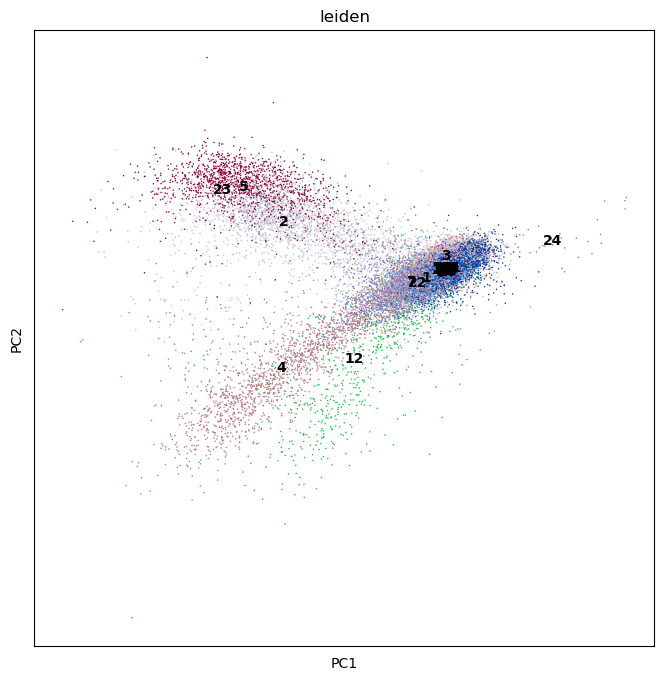

In [73]:
sc.tl.leiden(adata, resolution = 0.8, key_added= 'leiden')
sc.pl.pca(adata, color='leiden', legend_loc = 'on data')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)
--> added 'pos', the PAGA positions (adata.uns['paga'])


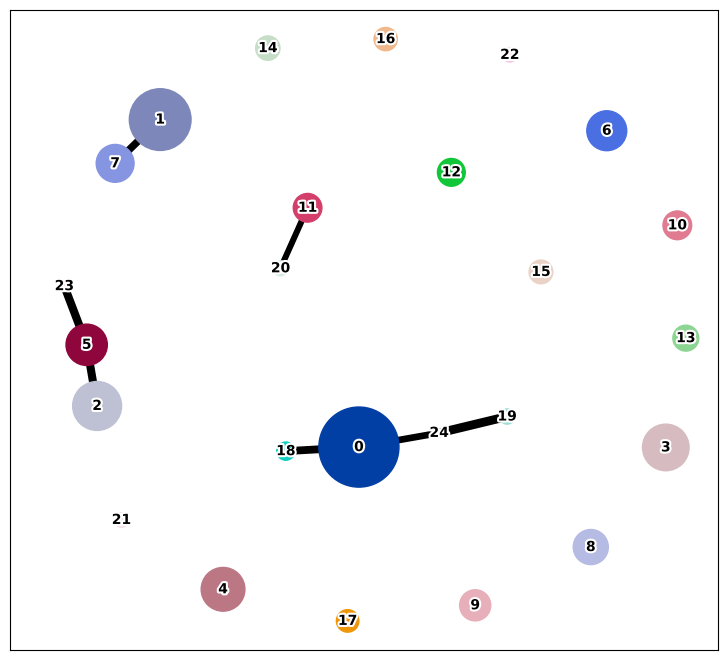

In [74]:
sc.tl.paga(adata, groups='leiden')
sc.pl.paga(adata,threshold = 0.5, labels=None, fontsize = 10, fontoutline = 3,node_size_scale = 3,node_size_power = 1,random_state = 0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


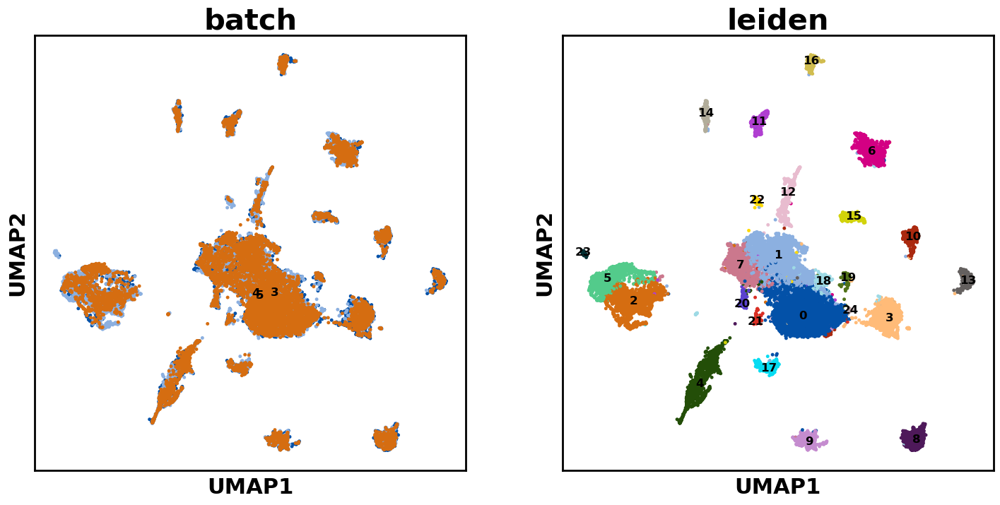

In [75]:
sc.tl.umap(adata, min_dist = 0.01, spread = 2,init_pos = 'paga')
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color = ['batch','leiden'],size = 50, legend_loc = 'on data', palette  = my_palette, ncols = 4, cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_withunmatched.png')

### Clustering and identity inference

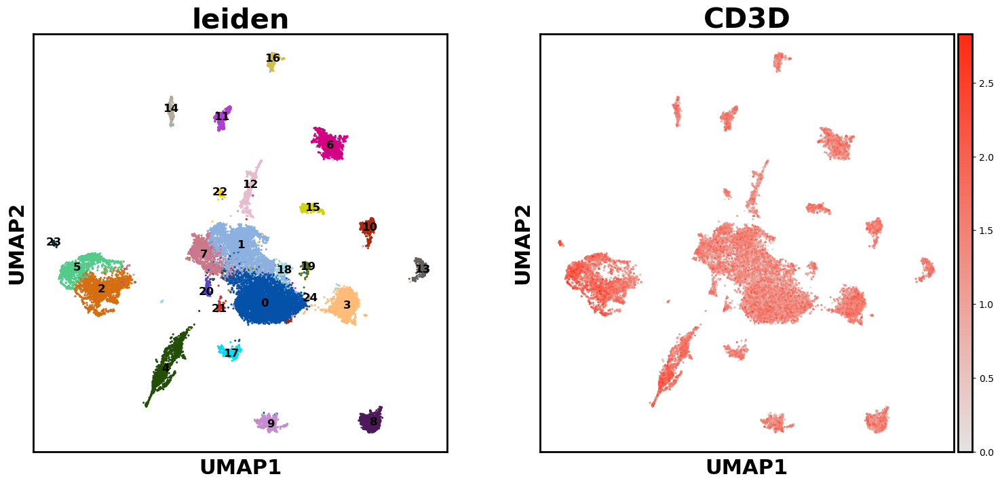

In [77]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['leiden','CD3D'],size =20, ncols = 4, cmap = my_cmap, palette  = my_palette,legend_loc = 'on data',return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_T.png')

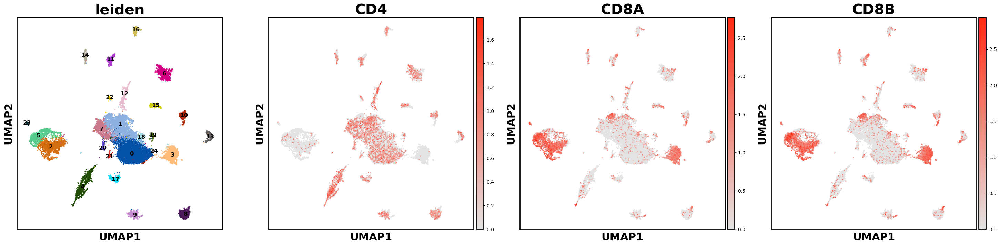

In [78]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['leiden','CD4','CD8A','CD8B'],size =20, ncols = 4,legend_loc = 'on data', cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_48.png')

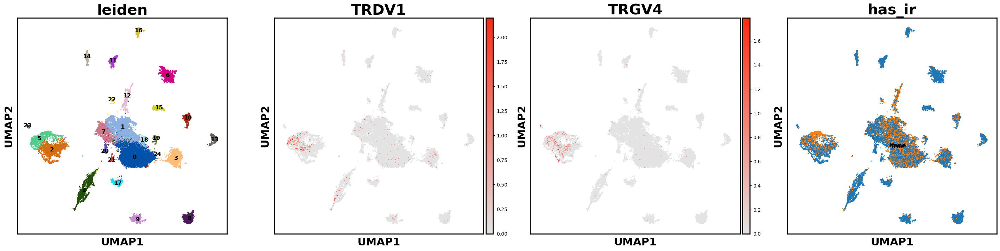

In [79]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['figure.figsize'] = [8,8]
fig = sc.pl.umap(adata, color=['leiden','TRDV1','TRGV4','has_ir'],size =20, ncols = 4,legend_loc = 'on data', cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_TCR.png')

In [80]:
adata.obs['has_ir_q']= adata.obs['has_ir'] == 'True'
adata.obs['has_ir_q']=adata.obs['has_ir_q'].values*1

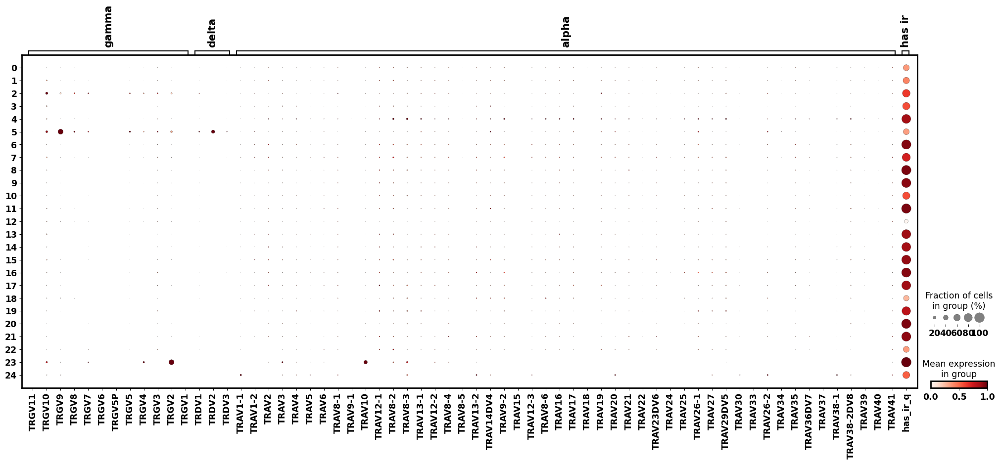

In [81]:
plt.rcParams.update({'font.size': 15, 'font.weight': 'heavy','axes.linewidth':2})
#plt.rcParams.update(plt.rcParamsDefault)
gamma_genesmask = [gene.startswith("TRGV") for gene in adata.var_names]
gamma_genes = adata.var_names[gamma_genesmask]
delta_genesmask = [gene.startswith("TRDV") for gene in adata.var_names]
delta_genes = adata.var_names[delta_genesmask]
alpha_genesmask = [gene.startswith("TRAV") for gene in adata.var_names]
alpha_genes = adata.var_names[alpha_genesmask]
TCR_exp_set ={
"gamma": gamma_genes, "delta": delta_genes, "alpha": alpha_genes, "has ir": 'has_ir_q'
}



sc.pl.dotplot(adata,TCR_exp_set,groupby = 'leiden' , vmax = 1, swap_axes = False, dot_min =0, dot_max =1,standard_scale = 'var')

In [82]:
adata.obs['MAIT_inference'] = np.array(adata.obs['TRAV'] == 'TRAV1-2') & np.array(adata.obs['TRAJ'].isin(['TRAJ33','TRAJ12','TRAJ20']))
adata.obs['MAIT_inference']*=1

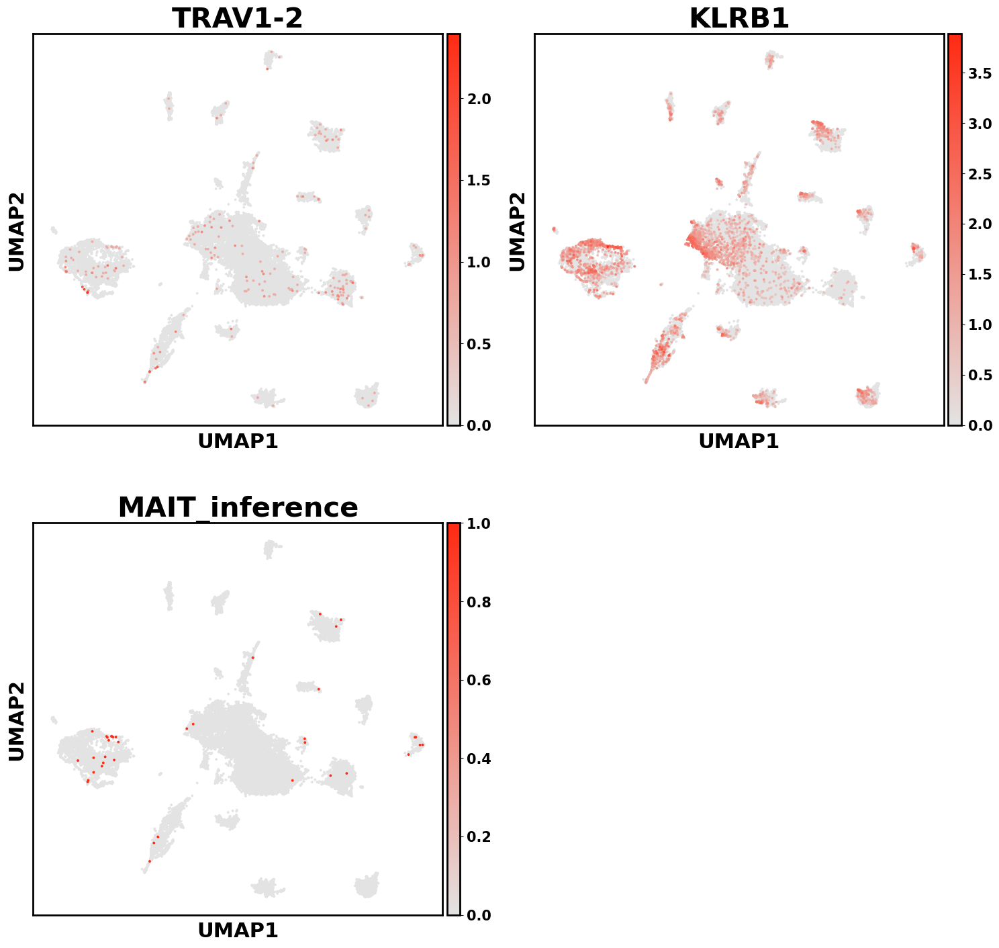

In [83]:
plt.close()
fig = sc.pl.umap(adata, color =['TRAV1-2','KLRB1','MAIT_inference'],ncols = 2,size = 30, legend_loc = 'on data', palette  = my_palette, cmap = my_cmap, return_fig = True, legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('MAIT.png') 

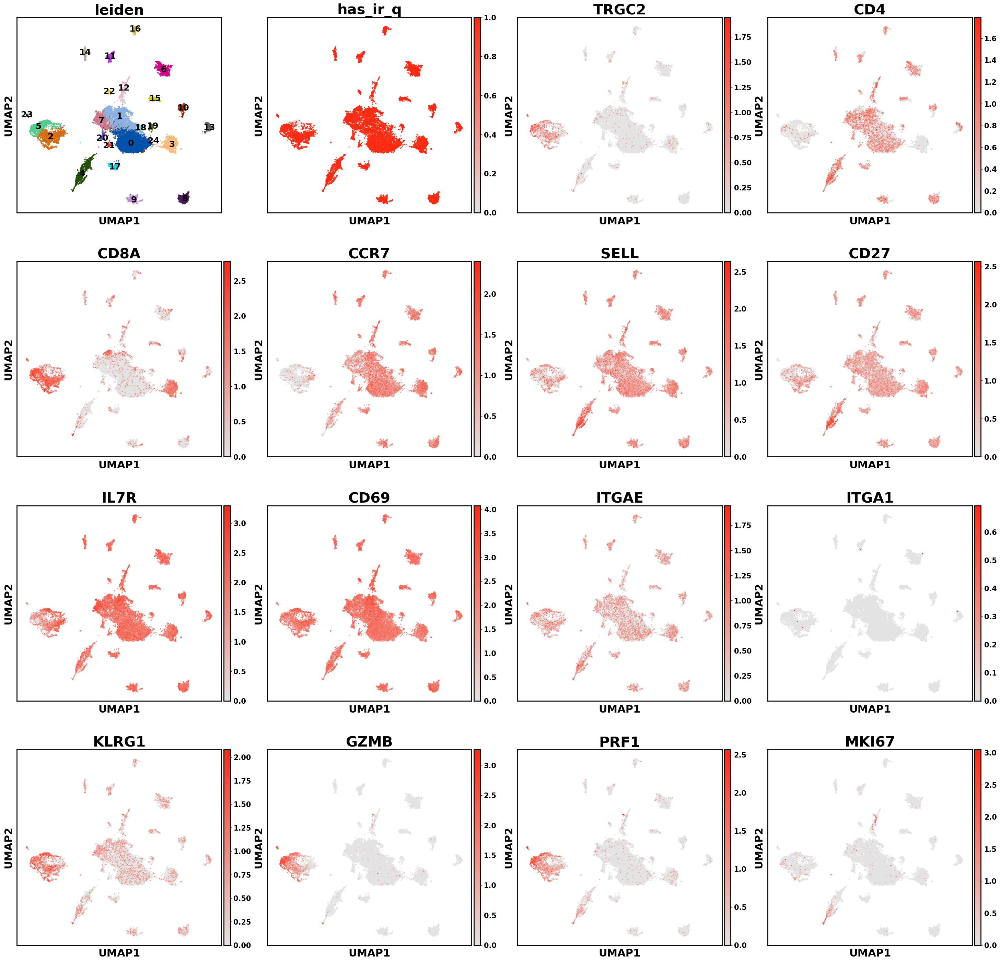

In [84]:
%matplotlib inline
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['leiden','has_ir_q','TRGC2','CD4','CD8A','CCR7','SELL','CD27','IL7R','CD69','ITGAE','ITGA1','KLRG1','GZMB','PRF1','MKI67'],
                 size =20, ncols = 4, cmap = my_cmap, return_fig = True, legend_loc = 'on data',legend_fontsize = 'large')
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')

#FAS = CD95, SELL = CD62L, TCF7 = TCF-1, IL7R = CD127, KLRB1 = CD161, KLRD1 = CD 94, CD39 = ENTPD1
#RORC = RORrt, TBX21 = T-bet, ZNF683 = hobit ITGA1 = CD49a; ITGAE = CD103; SPN = CD43; PTPRC = CD45RA

### Subcluster

Idea here is to first try separate phenotypically different cells

running Leiden clustering
    finished: found 28 clusters and added
    'leiden2', the cluster labels (adata.obs, categorical) (0:00:00)


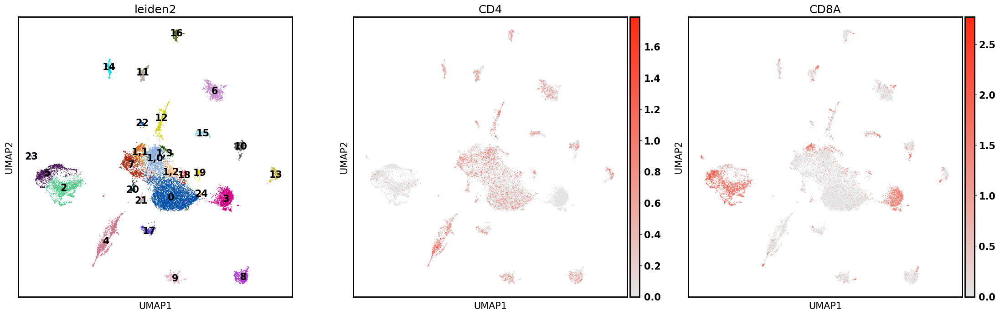

In [88]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden', ['1']), resolution = 0.3, key_added= 'leiden2')
sc.pl.umap(adata, color=['leiden2','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 31 clusters and added
    'leiden3', the cluster labels (adata.obs, categorical) (0:00:00)


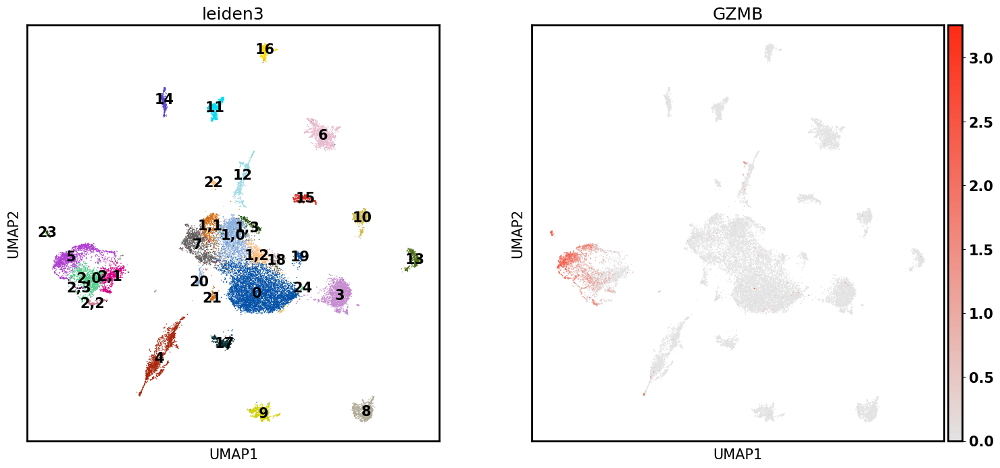

In [93]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden2', ['2']), resolution = 0.25, key_added= 'leiden3')
sc.pl.umap(adata, color=['leiden3','GZMB'], legend_loc = 'on data', cmap = my_cmap, palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 34 clusters and added
    'leiden4', the cluster labels (adata.obs, categorical) (0:00:00)


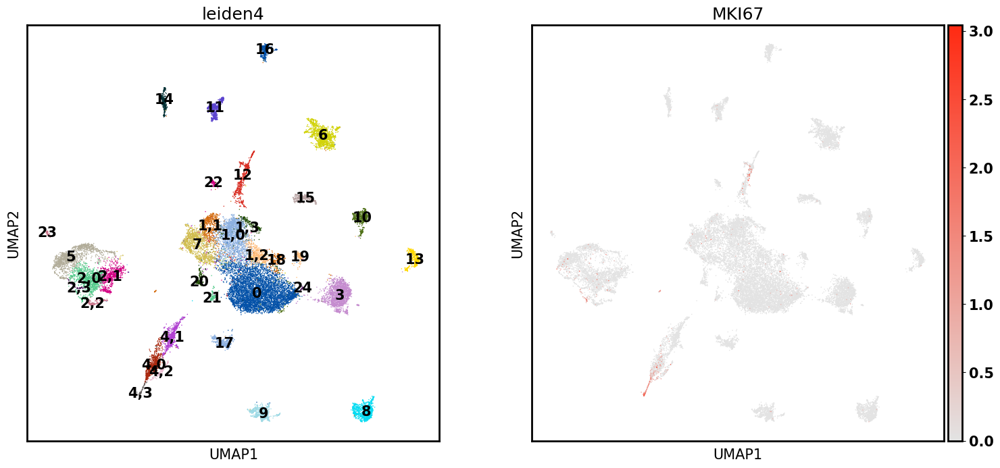

In [97]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden3', ['4']), resolution = 0.3, key_added= 'leiden4')
sc.pl.umap(adata, color=['leiden4','MKI67'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 36 clusters and added
    'leiden5', the cluster labels (adata.obs, categorical) (0:00:00)


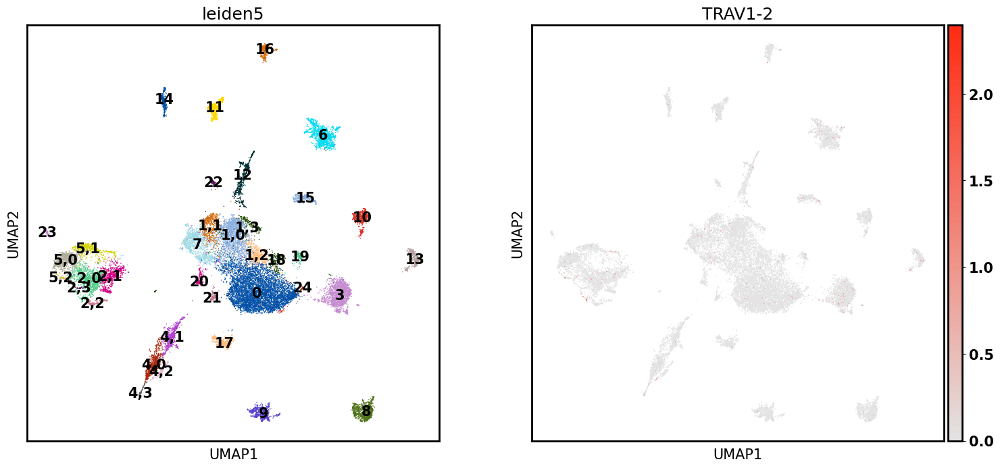

In [103]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden4', ['5']), resolution = 0.2, key_added= 'leiden5')
sc.pl.umap(adata, color=['leiden5','TRAV1-2'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 38 clusters and added
    'leiden6', the cluster labels (adata.obs, categorical) (0:00:00)


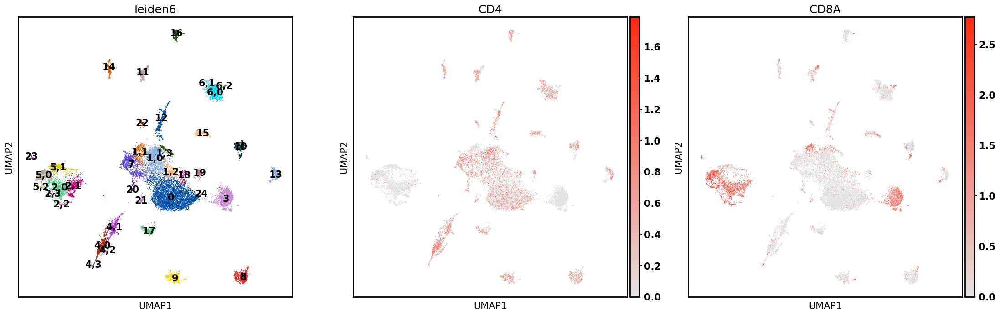

In [104]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden5', ['6']), resolution = 0.2, key_added= 'leiden6')
sc.pl.umap(adata, color=['leiden6','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette=my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 39 clusters and added
    'leiden7', the cluster labels (adata.obs, categorical) (0:00:00)


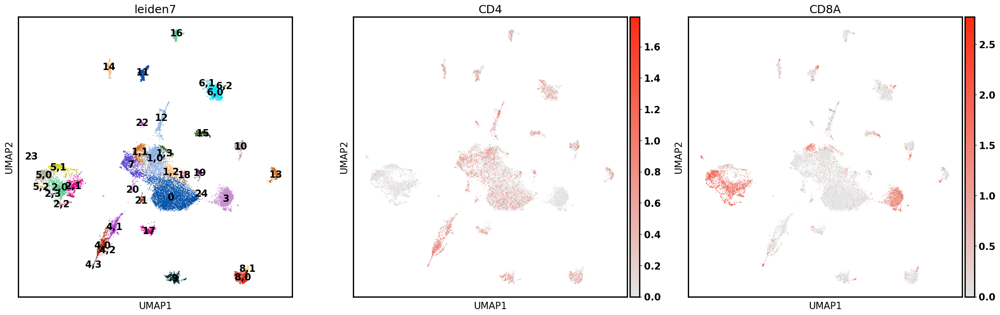

In [105]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden6', ['8']), resolution = 0.2, key_added= 'leiden7')
sc.pl.umap(adata, color=['leiden7','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 40 clusters and added
    'leiden8', the cluster labels (adata.obs, categorical) (0:00:00)


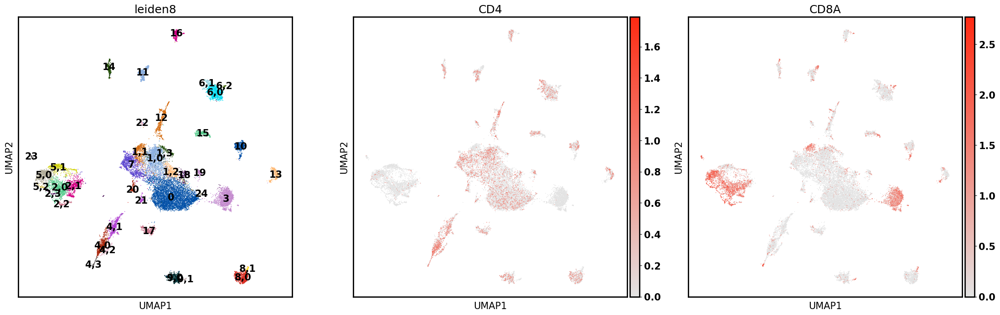

In [107]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden7', ['9']), resolution = 0.15, key_added= 'leiden8')
sc.pl.umap(adata, color=['leiden8','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 41 clusters and added
    'leiden9', the cluster labels (adata.obs, categorical) (0:00:00)


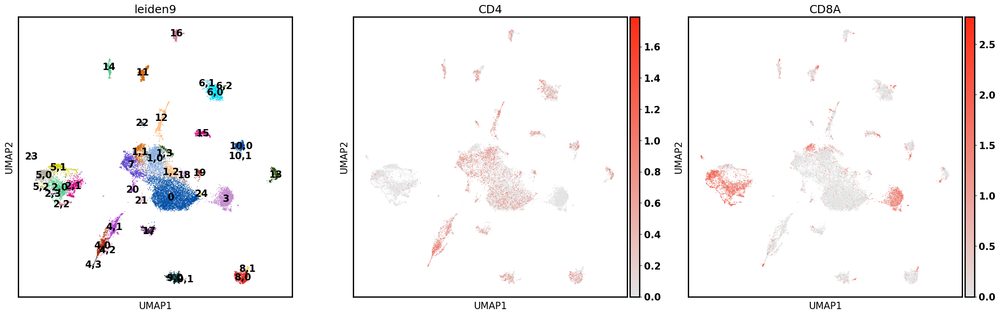

In [109]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden8', ['10']), resolution = 0.2, key_added= 'leiden9')
sc.pl.umap(adata, color=['leiden9','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 42 clusters and added
    'leiden10', the cluster labels (adata.obs, categorical) (0:00:00)


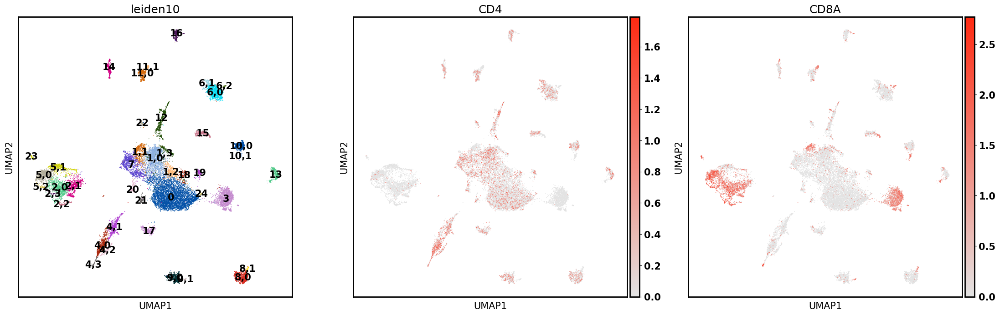

In [111]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden9', ['11']), resolution = 0.15, key_added= 'leiden10')
sc.pl.umap(adata, color=['leiden10','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 43 clusters and added
    'leiden11', the cluster labels (adata.obs, categorical) (0:00:00)


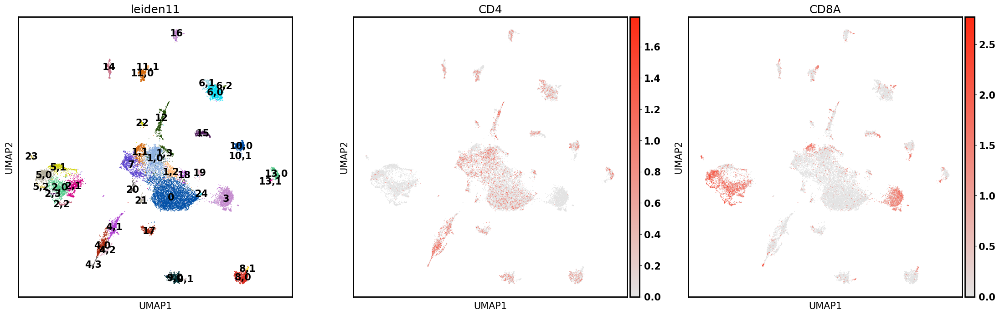

In [115]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden10', ['13']), resolution = 0.15, key_added= 'leiden11')
sc.pl.umap(adata, color=['leiden11','CD4','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 44 clusters and added
    'leiden12', the cluster labels (adata.obs, categorical) (0:00:00)


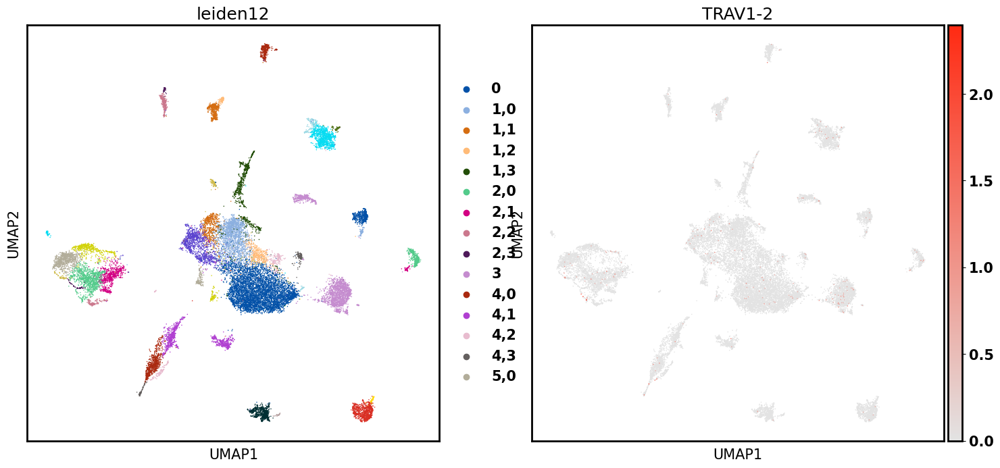

In [117]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden11', ['14']), resolution = 0.15, key_added= 'leiden12')
sc.pl.umap(adata, color=['leiden12','CD4','CD8A'], cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 45 clusters and added
    'leiden13', the cluster labels (adata.obs, categorical) (0:00:00)


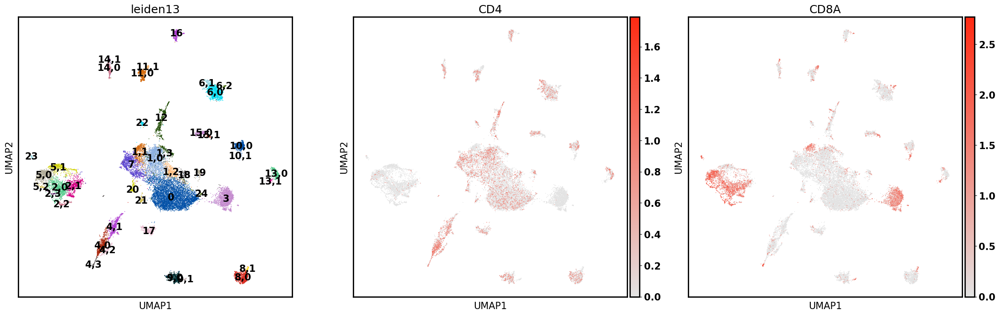

In [120]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden12', ['15']), resolution = 0.15, key_added= 'leiden13')
sc.pl.umap(adata, color=['leiden13','CD4','CD8A'],legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 48 clusters and added
    'leiden14', the cluster labels (adata.obs, categorical) (0:00:00)


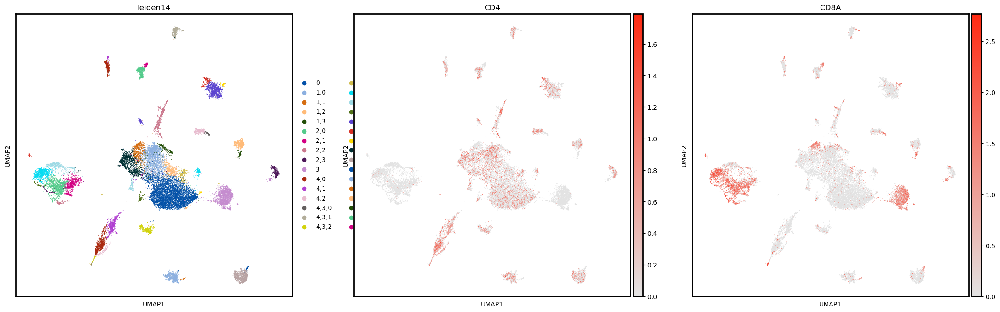

In [208]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden13', ['4,3']), resolution = 0.7, key_added= 'leiden14')
sc.pl.umap(adata, color=['leiden14','CD4','CD8A'], cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

running Leiden clustering
    finished: found 49 clusters and added
    'leiden15', the cluster labels (adata.obs, categorical) (0:00:00)


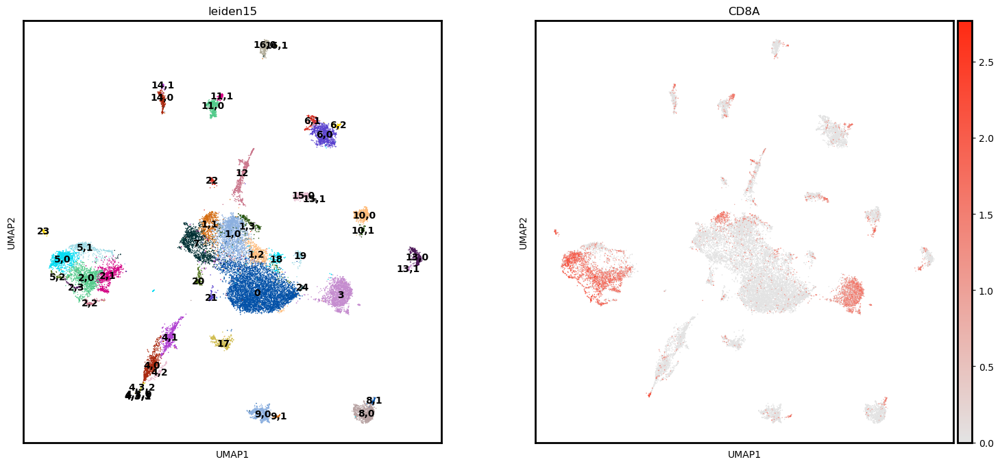

In [209]:
plt.rcParams['figure.figsize'] = [8,8]
sc.tl.leiden(adata, restrict_to = ('leiden14', ['16']), resolution = 0.15, key_added= 'leiden15')
sc.pl.umap(adata, color=['leiden15','CD8A'], legend_loc = 'on data', cmap = my_cmap,palette = my_palette)
#go back to the DE section to make sure this subcluster make sense

In [210]:
adata.obs['cluster_blind'] = adata.obs.groupby('leiden15').ngroup().astype('str')

... storing 'cluster_blind' as categorical


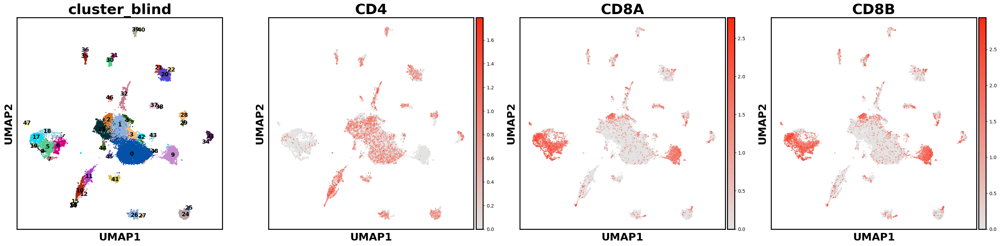

In [211]:
plt.close()
plt.rcParams['axes.linewidth'] = 2
fig = sc.pl.umap(adata, color=['cluster_blind','CD4','CD8A','CD8B'],size =20, ncols = 4,legend_loc = 'on data', cmap = my_cmap, return_fig = True, legend_fontsize = 'large',palette = my_palette)
ax = fig.get_axes()
for i in range(0,len(ax)):
    ax[i].xaxis.label.set_fontsize(22)
    ax[i].xaxis.label.set_fontweight('bold')
    ax[i].yaxis.label.set_fontsize(22)
    ax[i].title.set_fontsize(30)
    ax[i].yaxis.label.set_fontweight('bold')
    ax[i].title.set_fontweight('bold')
#plt.savefig('overall_map_48.png')

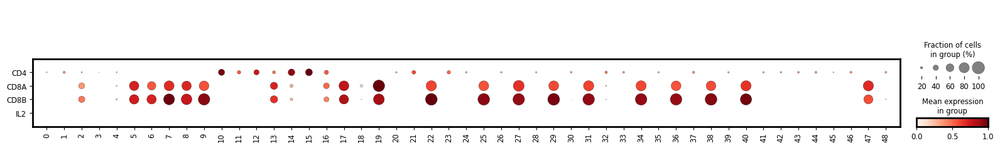

In [212]:
sc.pl.dotplot(adata,['CD4','CD8A','CD8B','IL2'],groupby = 'cluster_blind' , vmax = 1, swap_axes = True, dot_min =0.1, dot_max =1,standard_scale = 'var')

In [ ]:
adata.obs['general type'] = adata.obs['cluster_blind']
adata.obs['general type'] = adata.obs['general type'].astype('str')
gd = [18]
gd = [str(i) for i in gd]
cd8abs = ['17',
 '19',
 '2',
 '22',
 '25',
 '27',
 '29',
 '31',
 '34',
 '36',
 '38',
 '40',
 '47',
 '5',
 '6',
 '7',
 '8',
 '9']
for c_id in set(adata.obs['cluster_blind']):
    if c_id in gd:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'TCRgd'}})
    elif c_id in cd8abs:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'TCRab CD8ab'}})
    else:
        adata.obs = adata.obs.replace({'general type' : { c_id: 'TCRab CD4'}})
adata.obs['general type'] = adata.obs['general type'].astype('category')

In [ ]:
adata.obs['general subtype'] = adata.obs['cluster_blind']
adata.obs['general subtype'] = adata.obs['general subtype'].astype('str')


for c_id in set(adata.obs['cluster_blind']):
    if c_id in ['10', '16', '12', '13', '14', '11', '15']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'FOXP3+ Treg'}})
    elif c_id in ['46']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'TCM'}})
    elif c_id in ['6','18']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'TEM'}})
    elif c_id in ['17', '7', '8', '19', '5', '47']:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'Teff'}})
    else:
        adata.obs = adata.obs.replace({'general subtype' : { c_id: 'Naive/TCM'}})
adata.obs['general subtype'] = adata.obs['general subtype'].astype('category')

In [ ]:
adata.obs['celltype'] = adata.obs['general type'].astype(str).map(str)+' '+ adata.obs['general subtype'].astype(str).map(str)

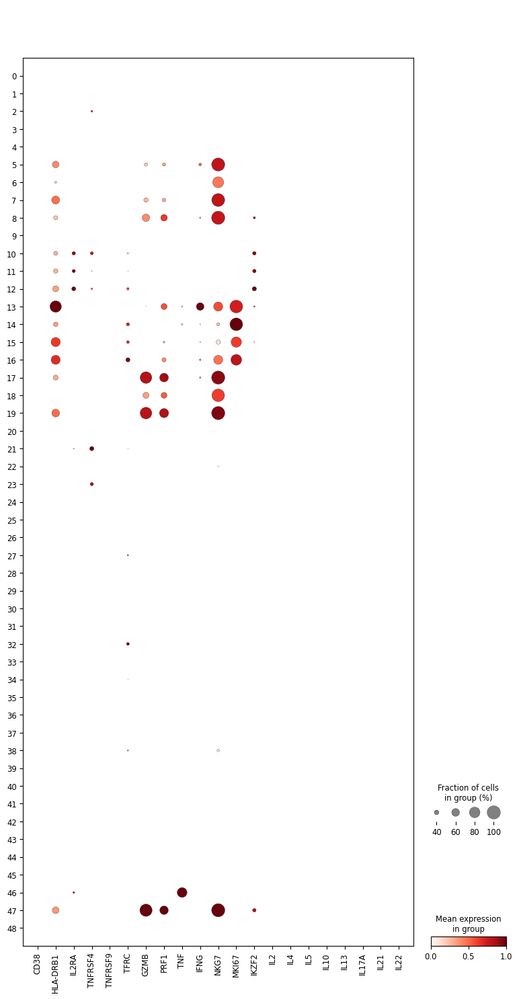

In [ ]:
plt.rcParams.update({'font.size': 5, 'font.weight': 'heavy','axes.linewidth':5})
plt.rcParams.update(plt.rcParamsDefault)


sc.pl.dotplot(adata,['CD38','HLA-DRB1',
                     'IL2RA', 'TNFRSF4','TNFRSF9', 'TFRC','GZMB', 'PRF1', 'TNF', 'IFNG', 'NKG7',
       'MKI67', 'IKZF2','IL2', 'IL4', 'IL5', 'IL10', 'IL13', 'IL17A',
       'IL21', 'IL22'],groupby = 'cluster_blind' , vmax = 1, 
              swap_axes = False ,dot_min = 0.2,standard_scale = 'var', save= 'activation.png')
# Checked IL9, nothing

In [ ]:
adata.obs['activation'] = adata.obs['cluster_blind']
adata.obs['activation'] = adata.obs['activation'].astype('str')


for c_id in set(adata.obs['cluster_blind']):
    if c_id in ['5','6','7','8','10','11','12','13','14','15','16','17','18','19','46','47']:
        adata.obs = adata.obs.replace({'activation' : { c_id: 'act'}})
    else:
        adata.obs = adata.obs.replace({'activation' : { c_id: 'rest'}})
adata.obs['activation'] = adata.obs['activation'].astype('category')